In [1]:
import osmnx as ox
import geopandas as gpd
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import mapclassify
import pathlib
import time
import contextily as ctx # for basemaps
import os
import datetime
import ast
import statsmodels.api as sm
import math
%matplotlib inline

# turn response caching on and turn on logging to your terminal window
ox.config(log_console=True, use_cache=True)

ox.__version__

'1.0.1'

# Functions

In [2]:
def save_plot(fig, ax, filepath=None, dpi=300, axes=True):
    
    imgs_folder = "./images"
    
    # default filepath, if none provided
    if filepath is None:
        filepath = pathlib.Path(imgs_folder) / "image.png"
    else:
        filepath = pathlib.Path(filepath)

    # if save folder does not already exist, create it
    filepath.parent.mkdir(parents=True, exist_ok=True)
    
    # get figure facecolor
    fc = fig.get_facecolor()
    if axes is not True:
        # constrain saved figure's extent to interior of the axis
        extent = ax.bbox.transformed(fig.dpi_scale_trans.inverted())
    else: extent=None
    
    # temporarily turn figure frame on to save with facecolor
    fig.set_frameon(True)
    fig.savefig(filepath, 
                dpi=dpi, 
                bbox_inches=extent,
                facecolor=fc,  
                transparent=True,
               )
    fig.set_frameon(False)  # and turn it back off again

In [3]:
def add_name2plot():
    ax.text(0.01, 0.008, 
            "\nAnalysis of the road network of Mérida, Yucatán, México",
            horizontalalignment='left',
            verticalalignment='bottom',
            transform=ax.transAxes, 
            color='white', 
            fontsize=14,
            style='italic',
            bbox={'facecolor': 'grey', 'alpha': 0.5, 'pad': 10}
           )
    ax.text(0.01, 0.01, 
            "Alejandro Puerto Castro\n",
            horizontalalignment='left',
            verticalalignment='bottom',
            transform=ax.transAxes, 
            color='white', 
            fontsize=14,
            fontweight='bold',
           )

In [4]:
# unpack k-counts and k-proportion dicts into individiual keys:values
def unpack(row):
    stats = row.to_dict()
    try:
        if 'streets_per_node_counts' in stats:
            for k, count in ast.literal_eval(stats['streets_per_node_counts']).items():
                stats['int_{}_streets_count'.format(k)] = count
        else:
            if 'st_n_cnts' in stats:
                for k, count in ast.literal_eval(stats['st_n_cnts']).items():
                    stats['int_{}_streets_count'.format(k)] = count
        if 'streets_per_node_proportion' in stats:
            for k, proportion in ast.literal_eval(stats['streets_per_node_proportion']).items():
                stats['int_{}_streets_prop'.format(k)] = proportion
        else:
            if 'st_n_prop' in stats:
                for k, proportion in ast.literal_eval(stats['st_n_prop']).items():
                    stats['int_{}_streets_prop'.format(k)] = proportion
    except Exception as e:
        print(e)
        pass
        
    return pd.Series(stats)

In [5]:
def get_graph_from_point(location_point, proj=False):
    # create a network around some (lat, lng) point
    G = ox.graph_from_point(location_point, dist=1000, simplify=False, network_type='drive')
    if proj:
        G = ox.project_graph(G, to_crs=3857)
    return G

# Merida municipality road network

In [6]:
places = [{'county' : 'Merida',
           'state' : 'Yucatan',
           'country' : 'Mexico'}]

def get_roads_osmnx(places, update=False, proj=False, crs=None):

    dirpath = pathlib.Path('./data/networks/')
    filepath = dirpath/'merida-road.graphml'
    logpath = dirpath/'log'
                                    
    if filepath.exists() and not update:
        G = ox.load_graphml(filepath)
    else:
        # get drivable public streets network, aka road network, without service roads,
        # e.g. private, parking lots, etc.
        # use retain_all if you want to keep all disconnected subgraphs (e.g. when your places aren't adjacent)
        # TODO: It would be nice to setup up a polygon for the city and its surrounding areas, to be sure
        # exactly the location.
        G = ox.graph_from_place(places, network_type='drive')
        ox.save_graphml(G, filepath=filepath, gephi=False)
        
    if proj:
        G = ox.project_graph(G, to_crs=crs)
    
    print(f"Graph created at: {G.graph['created_date']}")
    return G, *ox.graph_to_gdfs(G)
        
#G, nodes, edges = get_roads_osmnx(places, update=False)
G_proj, nodes_proj, edges_proj = get_roads_osmnx(places, update=False, proj=True, crs=3857)

Graph created at: 2021-03-31 01:02:44


In [7]:
print(f"The road network has {G_proj.number_of_edges()} edges and {G_proj.number_of_nodes()} nodes")

The road network has 93485 edges and 35105 nodes


In [8]:
## what sized area does our network cover in square meters?
graph_area_m = nodes_proj.unary_union.convex_hull.area # Squared meters
graph_area_km = graph_area_m / 1e6 # squared kilometers
print(f"{round(graph_area_m, 2)} squared meters")
print(f"{round(graph_area_km, 2)} squared kilometers")

1032365382.72 squared meters
1032.37 squared kilometers


As it is a disconnected network, we retain only the largest connected component:

In [9]:
# get largest strongly connected component
Gs = ox.utils_graph.get_largest_component(G_proj, strongly=True)
nodes, edges = ox.graph_to_gdfs(Gs)

In [10]:
print(f"The largest component has {Gs.number_of_edges()} edges and {Gs.number_of_nodes()} nodes")

The largest component has 93371 edges and 35031 nodes


In [11]:
print(f"It has the {round(Gs.number_of_edges()/G_proj.number_of_edges(), 4)}% of edges and {round(Gs.number_of_nodes()/G_proj.number_of_nodes(), 4)}% of nodes from the whole network")

It has the 0.9988% of edges and 0.9979% of nodes from the whole network


In [12]:
## what sized area does our largest component cover in square meters?
graph_area_m = nodes.unary_union.convex_hull.area
graph_area_km = graph_area_m / 1e6 # Squared meters? What is the oficial value?
graph_area_km # squared kilometers

1032.3653827209728

Nodes are street intersections, with y and x coordinates and the number of streets intersecting the node, and other potential attributes.

Nodes are indexed by an integer value.

In [13]:
Gs.nodes[287026838]

{'y': 2393289.4596048244,
 'x': -9975735.711525183,
 'street_count': 3,
 'lon': -89.6135586,
 'lat': 21.0118318}

We now list all attributes present in the graph nodes:

In [14]:
from itertools import chain

set(chain.from_iterable(d.keys() for *_, d in Gs.nodes(data=True)))

{'highway', 'lat', 'lon', 'ref', 'street_count', 'x', 'y'}

We have a highway attribute, how many nodes have this attribute?

In [15]:
h_count = 0
for node, attr in Gs.nodes.items():
    if 'highway' in attr.keys():
        h_count += 1
h_count

773

What are its possible values?

In [16]:
set(nx.get_node_attributes(Gs, 'highway').values())

{'crossing',
 'mini_roundabout',
 'motorway_junction',
 'traffic_signals',
 'turning_circle',
 'turning_loop'}

Edges are roads and are indexed by their starting and ending nodes, and a zero. They are tuple objects.

The zero is the edge key, since in a multigraph we can have potentially more than one edge between a pair of nodes, each edge is identified by a key.

In [17]:
set(chain.from_iterable(d.keys() for *_, d in Gs.edges(data=True)))

{'access',
 'bridge',
 'geometry',
 'highway',
 'junction',
 'lanes',
 'length',
 'maxspeed',
 'name',
 'oneway',
 'osmid',
 'ref',
 'tunnel',
 'width'}

Visualize the road network of Merida municipality:

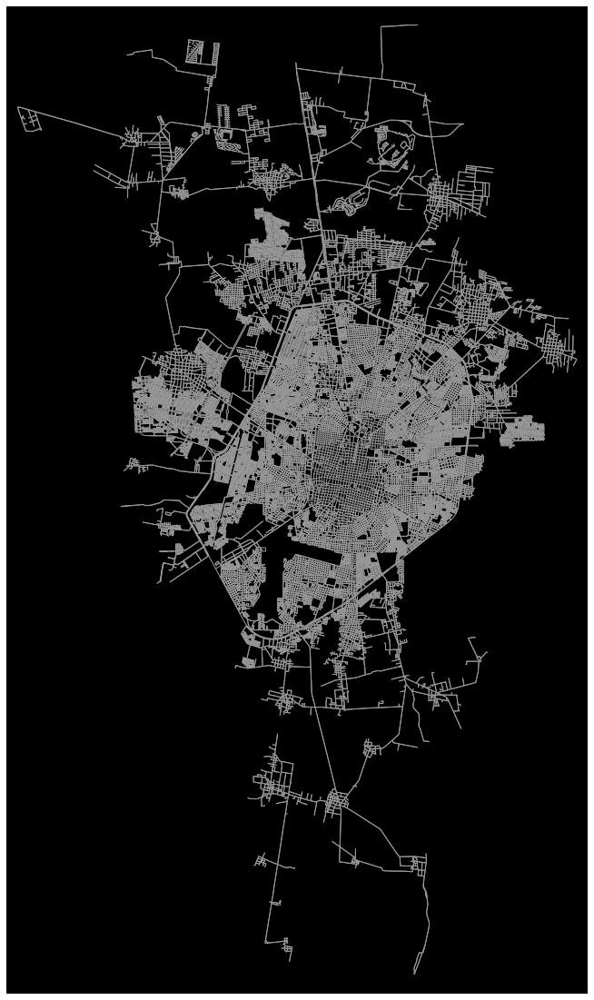

In [18]:
fig, ax = ox.plot_graph(Gs, node_size=0, node_color='white', node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False
                       )
        
#add_name2plot()
save_plot(fig, ax, filepath='./images/merida-road-network.png', dpi=500, axes=False)
plt.show()

Visualize the Merida road network with municipal boundary

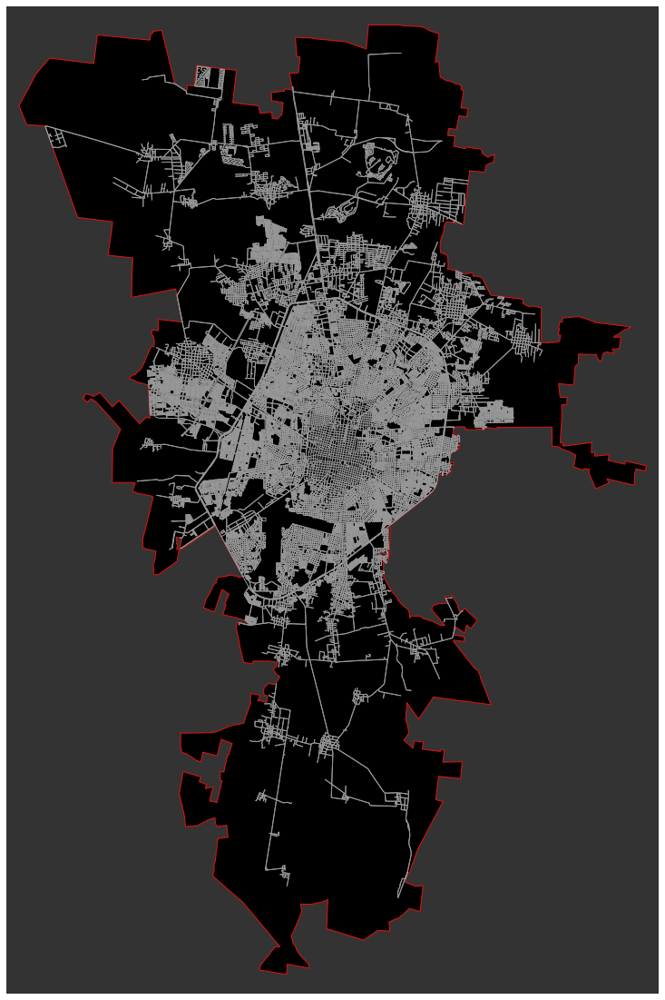

In [19]:
from descartes import PolygonPatch
from shapely.geometry import Polygon, MultiPolygon

gdf = ox.geocode_to_gdf(places)

# project it from CRS 3857 to 4326 for OSM projection
G = ox.project_graph(Gs, to_crs=4326)

fig, ax = ox.plot_graph(G, node_size=0, node_color='white', node_zorder=2, bgcolor='#333333', 
                        figsize=(20, 20), 
                        show=False
                       )
# to this matplotlib axis, add the place shape as descartes polygon patches
for geometry in gdf['geometry'].tolist():
    if isinstance(geometry, (Polygon, MultiPolygon)):
        if isinstance(geometry, Polygon):
            geometry = MultiPolygon([geometry])
        for polygon in geometry:
            patch = PolygonPatch(polygon, fc='k', ec='#e91010', lw=1, alpha=1, zorder=-1)
            ax.add_patch(patch)

# optionally set up the axes extents
margin = 0.02
west, south, east, north = gdf.unary_union.bounds
margin_ns = (north - south) * margin
margin_ew = (east - west) * margin
ax.set_ylim((south - margin_ns, north + margin_ns))
ax.set_xlim((west - margin_ew, east + margin_ew))

save_plot(fig, ax, filepath='./images/merida-road-network-boundary.png', dpi=500, axes=False)
plt.show()

Load network stats:

In [20]:
stats_merida = pd.read_csv('./data/stats_merida_road_network.csv', encoding='utf-8')
# unpack k-counts and k-proportion dicts into individiual keys:values
stats_merida = stats_merida.apply(unpack, axis=1)
# convert into Series
stats_merida = stats_merida.squeeze()

In [21]:
# drop the metrics that have values per node
stats_merida.drop(index=['streets_per_node_counts', 
                           'streets_per_node_proportion',
                           'avg_neighbor_degree',
                           'avg_weighted_neighbor_degree',
                           'degree_centrality',
                           'clustering_coefficient',
                           'clustering_coefficient_weighted',
                           'pagerank',
                           'betweenness_centrality',
                           'closeness_centrality',
                           'nodes'
                          ])

n                                                  35031
m                                                  93371
k_avg                                           5.330764
intersection_count                                 31837
streets_per_node_avg                            3.129542
edge_length_total                            9305581.721
edge_length_avg                                 99.66244
street_length_total                          5429553.502
street_length_avg                              99.177173
street_segments_count                              54746
node_density_km                                33.932753
intersection_density_km                        30.838888
edge_density_km                              9013.845172
street_density_km                            5259.333171
circuity_avg                                    0.963925
self_loop_proportion                            0.001253
clean_intersection_count                           24684
clean_intersection_density_km  

### Plot Distribution per intersection types

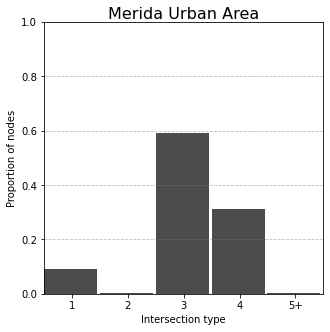

In [22]:
prop = ast.literal_eval(stats_merida['streets_per_node_proportion']) # when Series

max_value = 4
all_others = sum(list(prop.values())[max_value + 1:])
prop = {key:value for key, value in prop.items() if key <= max_value}
prop[max_value + 1] = all_others
lefts = [x - 0.5 for x in prop.keys()]

fig, ax = plt.subplots(figsize=(5,5))
ax.bar(lefts, prop.values(), width=0.95, alpha=0.7,
           color='k', linewidth=0, align='edge')

xticklabels = list(range(0, max_value + 1)) + ['{}+'.format(max_value + 1)]
ax.set_xticks(list(range(len(xticklabels))))
ax.set_xticklabels(xticklabels)
ax.set_title('Merida Urban Area', fontsize=16, y=0.99)
ax.set_xlim(0.5, max_value + 1.5)
ax.set_ylim(0, 1)
ax.yaxis.grid(True, linestyle='--', which='major',
                   color='grey', alpha=.50)
ax.set_xlabel('Intersection type')
ax.set_ylabel('Proportion of nodes')
fig.set_facecolor('white')
save_plot(fig, ax, './images/merida-street-per-node-proportion-distribution', axes=True)
plt.show()

## Betweenness centrality

In [23]:
btwn_scores = ast.literal_eval(stats_merida['betweenness_centrality'])
max_node, max_bc = max(btwn_scores.items(), key=lambda x: x[1])
max_node, max_bc

(325837916, 0.06698246688256433)

In the city of Mérida, Yucatán, the node with the highest betwenness centrality has ~7% of all shortest paths running through it. Let's highlight it in the plot:

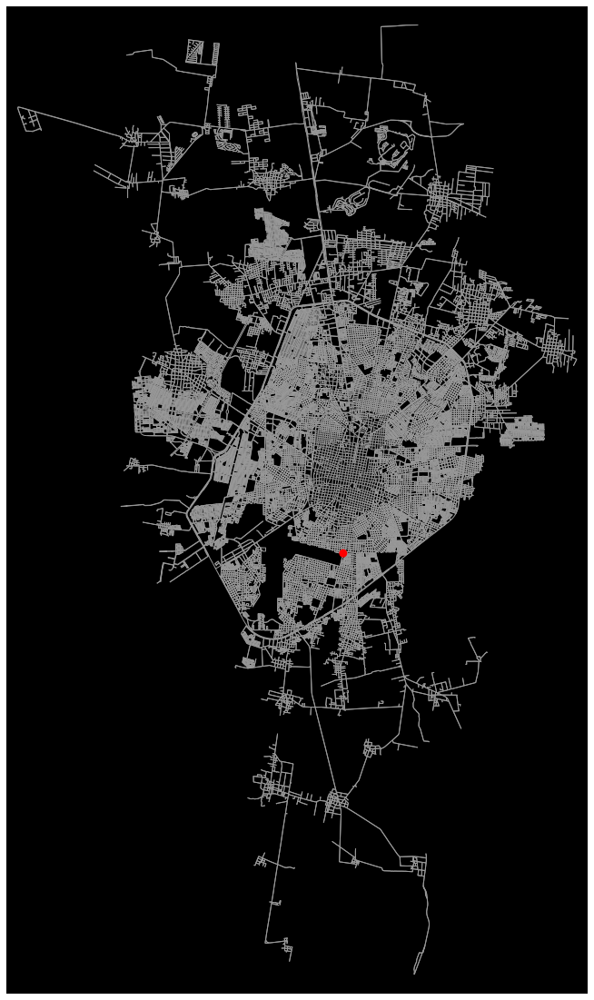

In [24]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/betweenness_maxNode_wholeNetwork.png', dpi=500, axes=False)
plt.show()

A closer look:

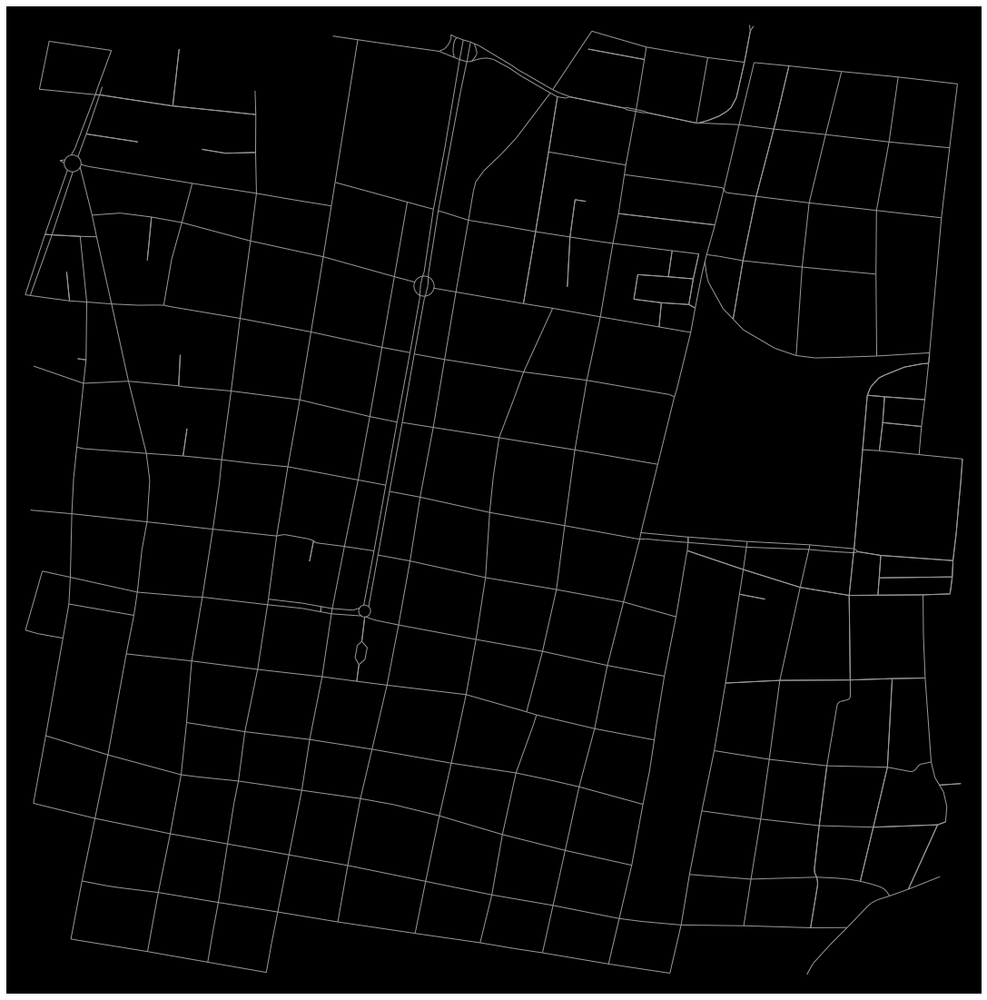

In [25]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9774, -89.6169)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==max_node else 'w' for node in G.nodes()]
ns = [80 if node==max_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20),
                        show=False
                       )
save_plot(fig, ax, filepath='./images/betweenness_maxNode_ZoomCity.png', dpi=300, axes=False)
plt.show()

A more closer look:

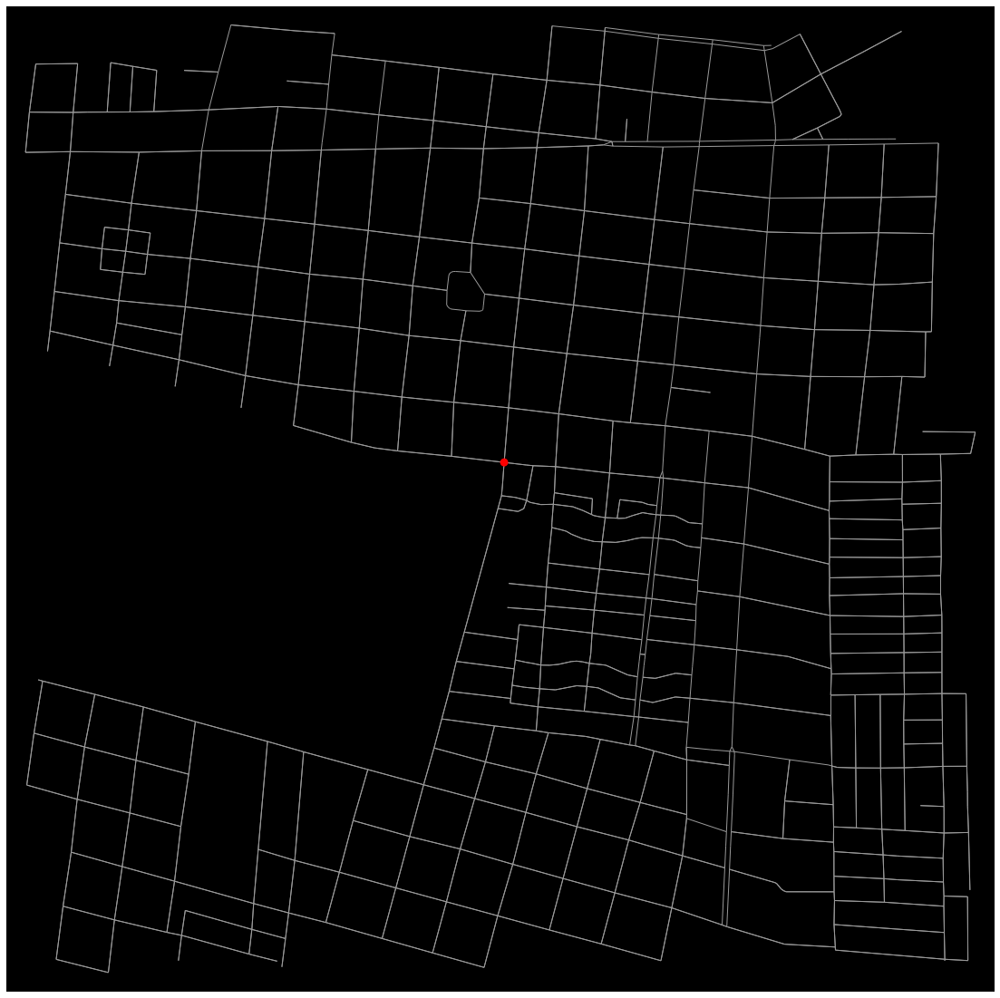

In [26]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9314, -89.6252)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==max_node else 'w' for node in G.nodes()]
ns = [80 if node==max_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G,  
                        node_size=ns, 
                        node_color=nc, 
                        node_zorder=2, 
                        bgcolor='k',
                        figsize=(20, 20), 
                        show=False
                       )

save_plot(fig, ax, filepath='./images/betweenness_maxNode_ZoomSection.png', dpi=300, axes=False)
plt.show()

This node is the intersection at 121 street and 54 street, colonia Mercedes Barrera. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.93208%2C-89.62514#map=19/20.93208/-89.62514

~7% of all shortest paths run through the node highlighted in red. Let's look at the relative betweenness centrality of every node in the graph:

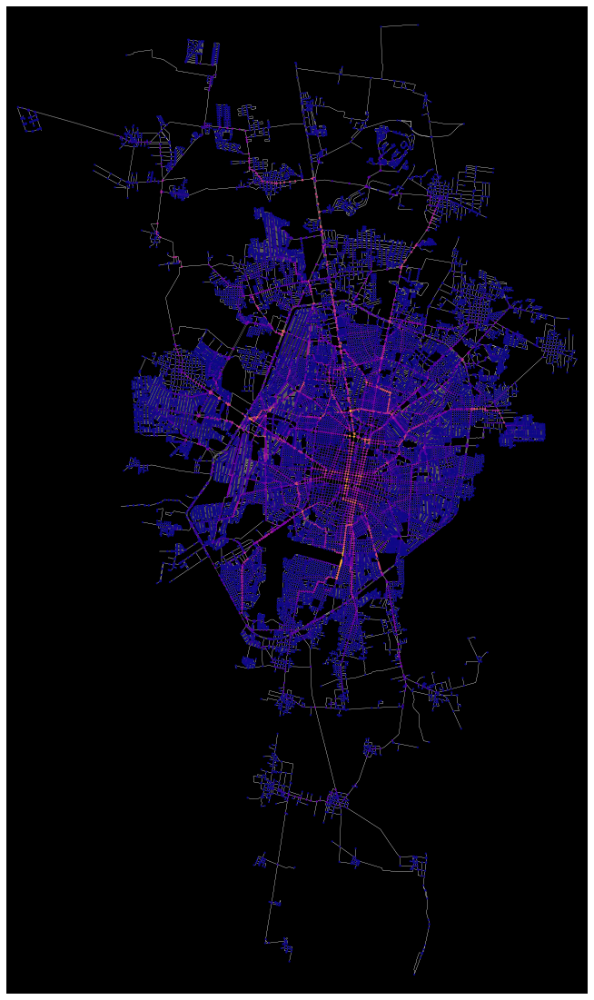

In [27]:
nx.set_node_attributes(Gs, btwn_scores, 'betweenness')
nc = ox.plot.get_node_colors_by_attr(Gs, 'betweenness', cmap='plasma')

fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='images/betweenness_allNodes.png', dpi=500, axes=False)
plt.show()

Above, the nodes are visualized by betweenness centrality, from low (dark violet) to high (light yellow). The colors in the colorspace are linearly mapped to the attribute values.

## Closeness centrality

In [28]:
closeness_scores = ast.literal_eval(stats_merida['closeness_centrality'])
max_node, max_cc = max(closeness_scores.items(), key=lambda x: x[1])
max_node, max_cc

(317734720, 0.00011565235488806694)

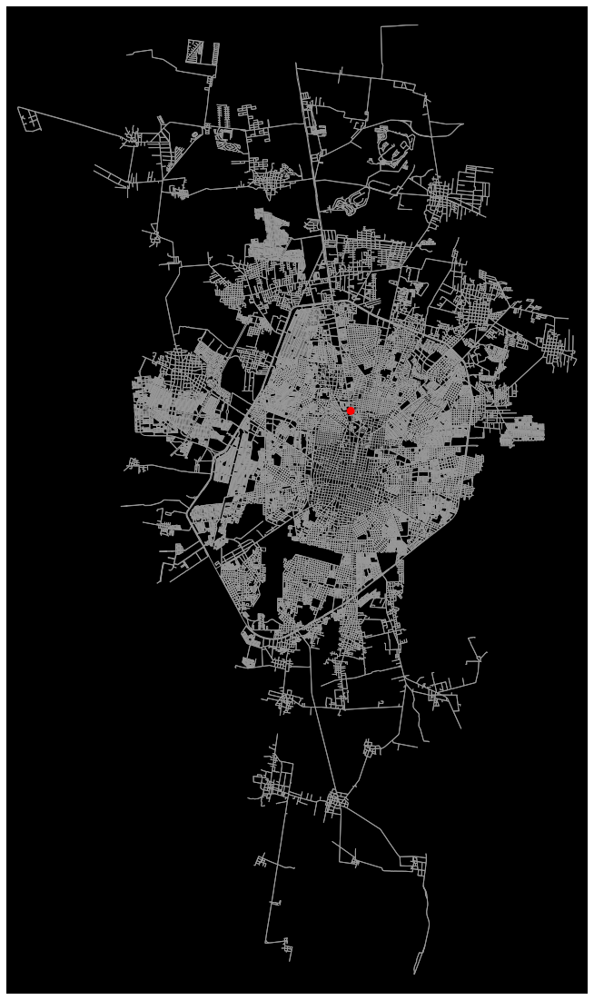

In [29]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/closeness_maxNode_wholeNetwork.png', dpi=500, axes=False)
plt.show()

A closer look:

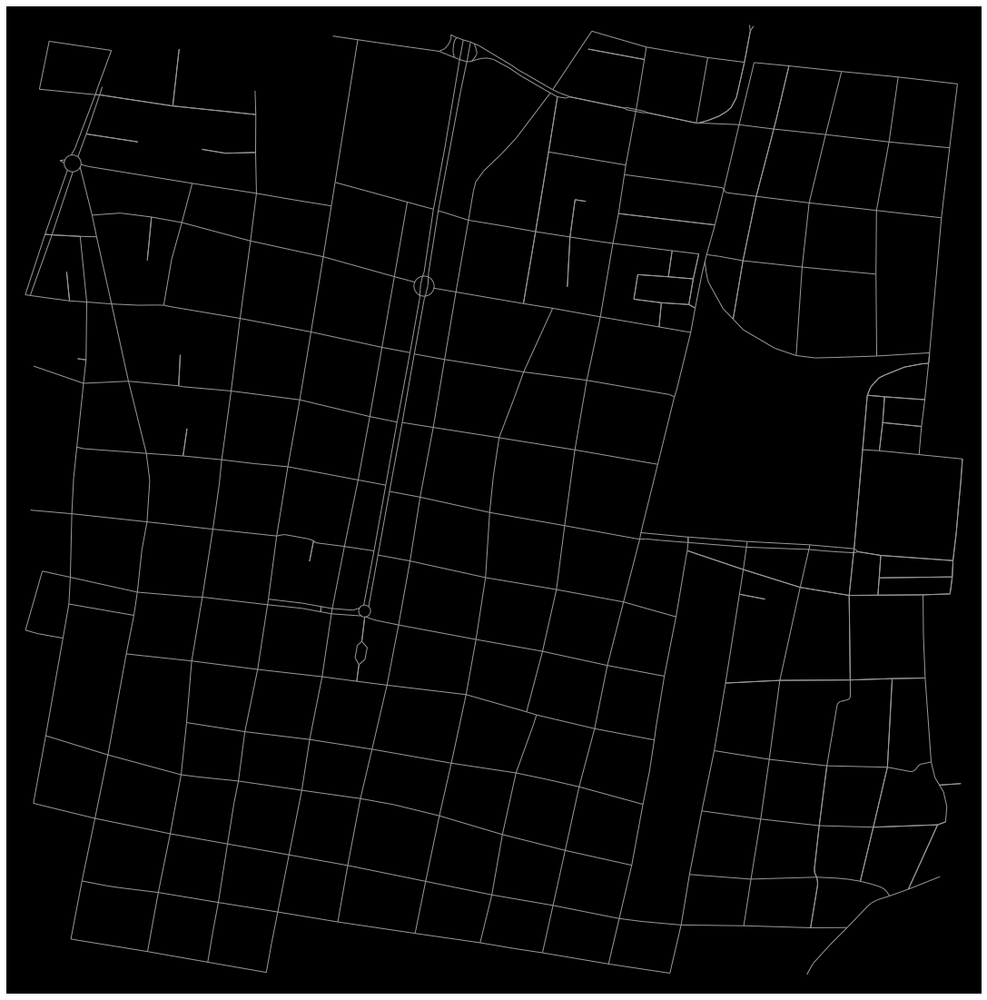

In [30]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9774, -89.6169)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==max_node else 'w' for node in G.nodes()]
ns = [80 if node==max_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/closeness_maxNode_ZoomCity.png', dpi=300, axes=False)
plt.show()

A more closer look: 

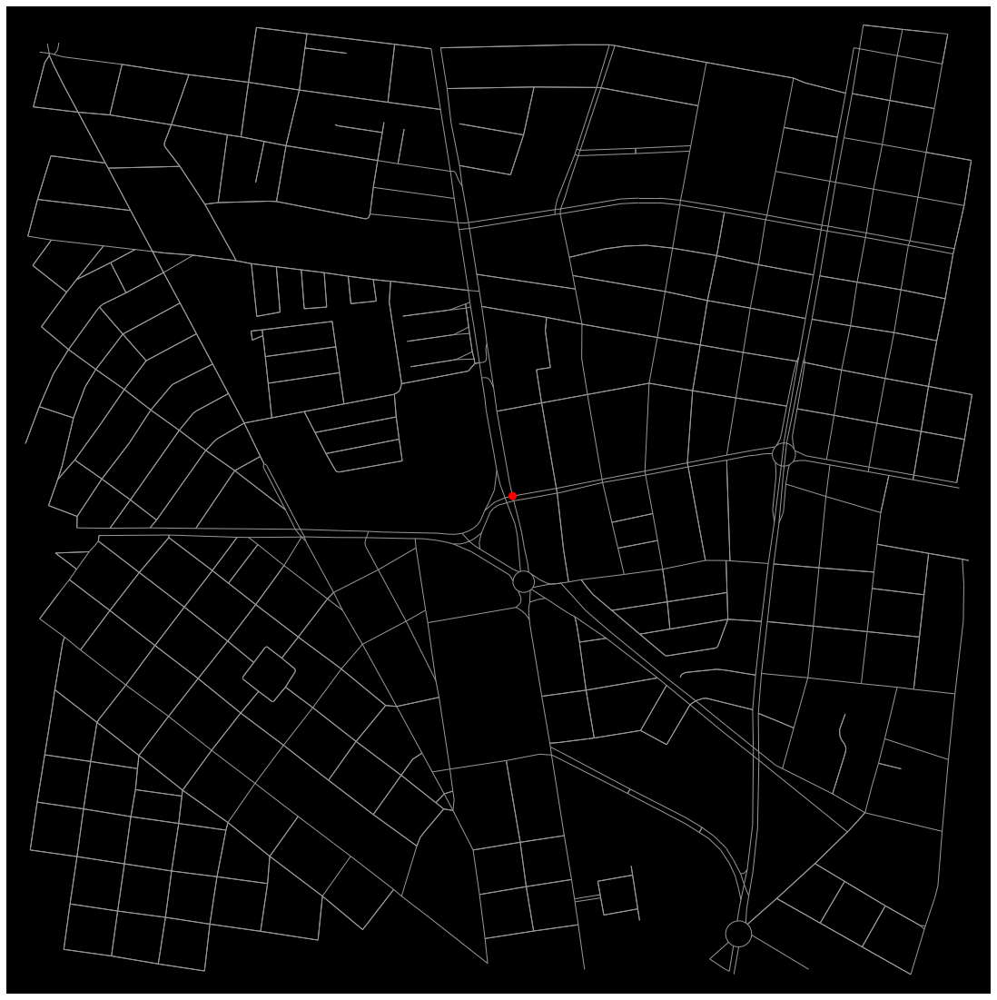

In [31]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9979, -89.6217)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==max_node else 'w' for node in G.nodes()]
ns = [80 if node==max_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/closeness_maxNode_ZoomSection.png', dpi=300, axes=False)
plt.show()

This node is located at the Circuito Colonias and 60 street. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.99798%2C-89.62143#map=19/20.99798/-89.62143

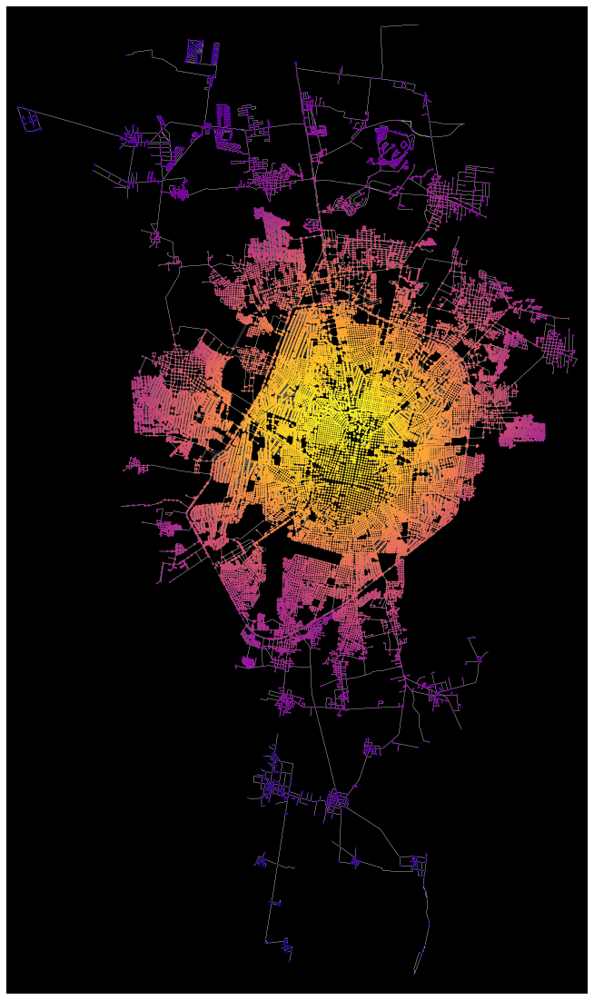

In [32]:
nx.set_node_attributes(Gs, closeness_scores, 'closeness')
nc = ox.plot.get_node_colors_by_attr(Gs, 'closeness', cmap='plasma')

fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/closeness_allNodes.png', dpi=500, axes=False)
plt.show()

## Degree centrality

In [33]:
degree_centrality = ast.literal_eval(stats_merida['degree_centrality'])
max_node, max_dc = max(degree_centrality.items(), key=lambda x: x[1])
max_node, max_dc

(287684975, 0.00028546959748786756)

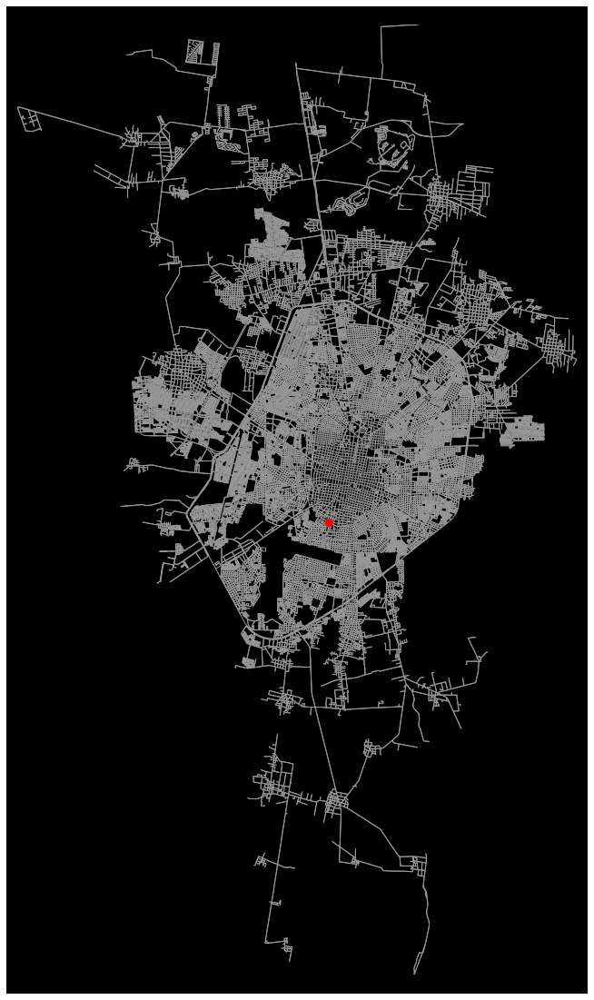

In [34]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/degreeCent_maxNode_wholeNetwork.png', dpi=500, axes=False)
plt.show()

A closer look:

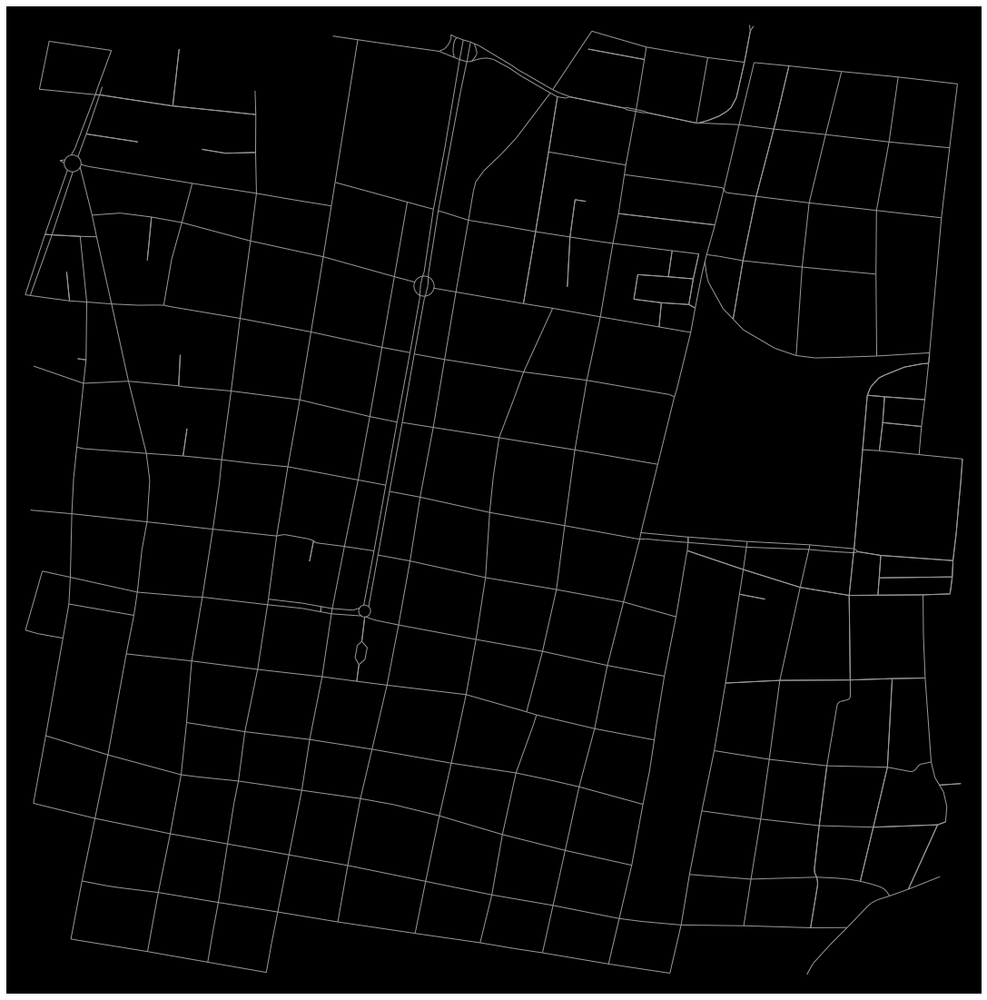

In [35]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9774, -89.6169)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==max_node else 'w' for node in G.nodes()]
ns = [80 if node==max_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/degreeCent_maxNode_ZoomCity.png', dpi=300, axes=False)
plt.show()

A more closer look: 

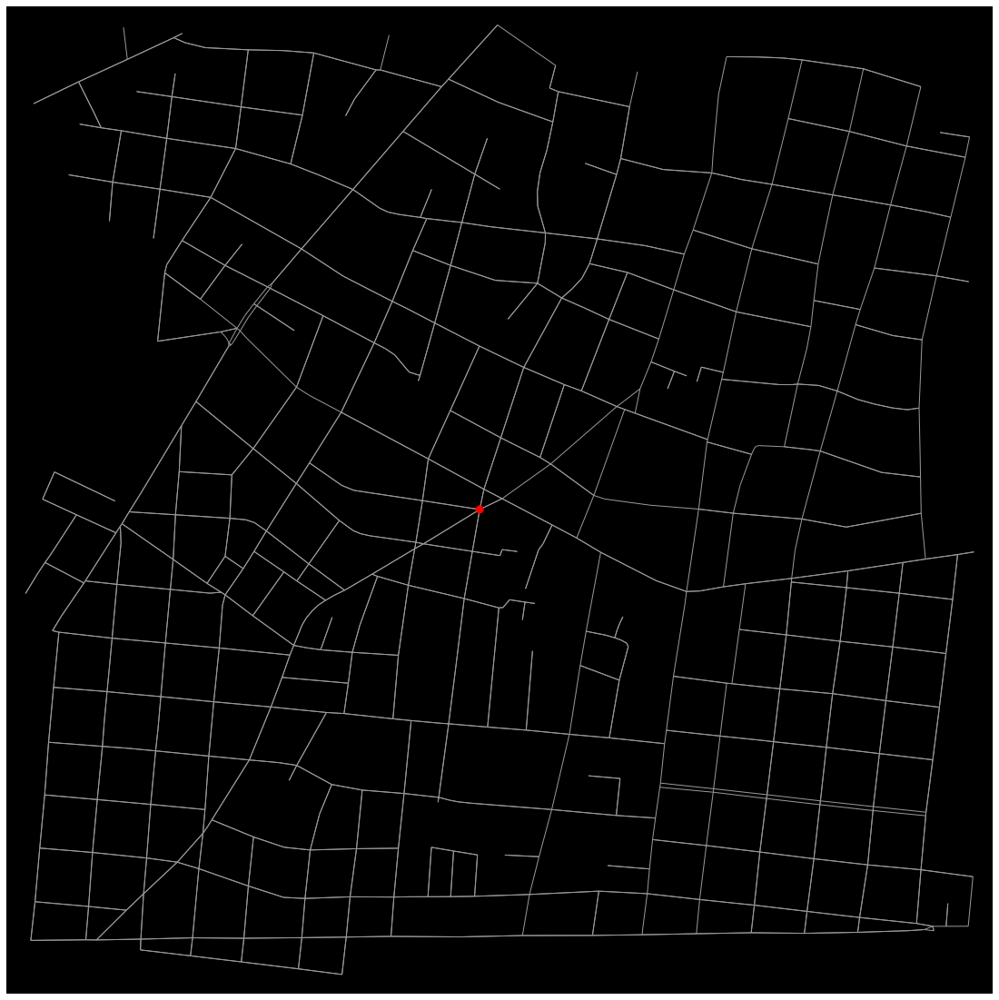

In [36]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9462, -89.6317)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==max_node else 'w' for node in G.nodes()]
ns = [80 if node==max_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/degreeCent_maxNode_ZoomSection.png', dpi=300, axes=False)
plt.show()

This node is located at 64 street with 95 and 75 street, colonia Meliton Salazar. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.94602%2C-89.63212#map=18/20.94602/-89.63212

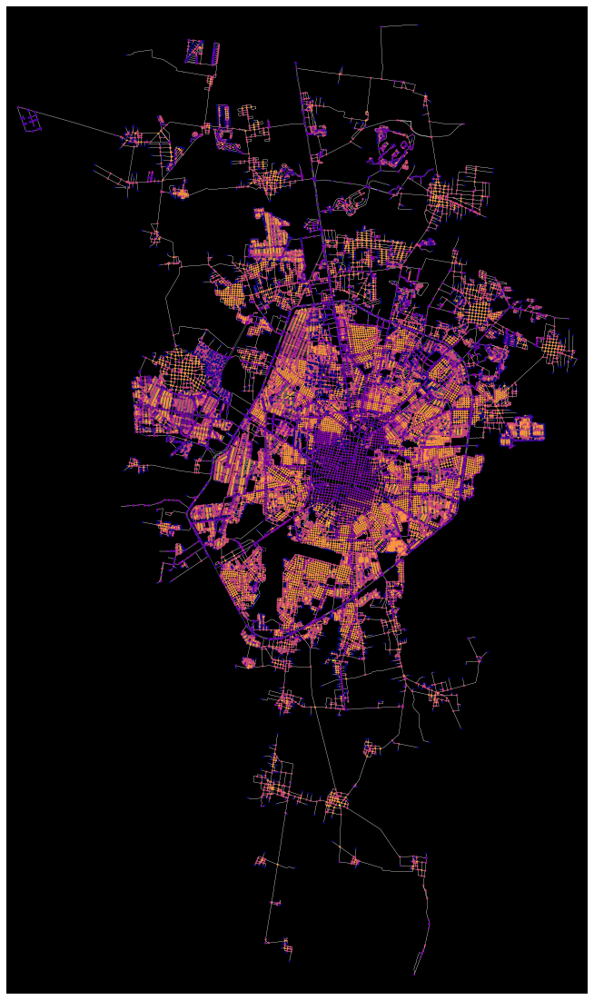

In [37]:
nx.set_node_attributes(Gs, degree_centrality, 'degree_centrality')
nc = ox.plot.get_node_colors_by_attr(Gs, 'degree_centrality', cmap='plasma')

fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/degreeCent_allNodes.png', dpi=500, axes=False)
plt.show()

## PageRank

### Max PageRank

In [38]:
max_node, max_pr = stats_merida['pagerank_max_node'], stats_merida['pagerank_max']
max_node, max_pr

(292288531, 0.0001248138573807)

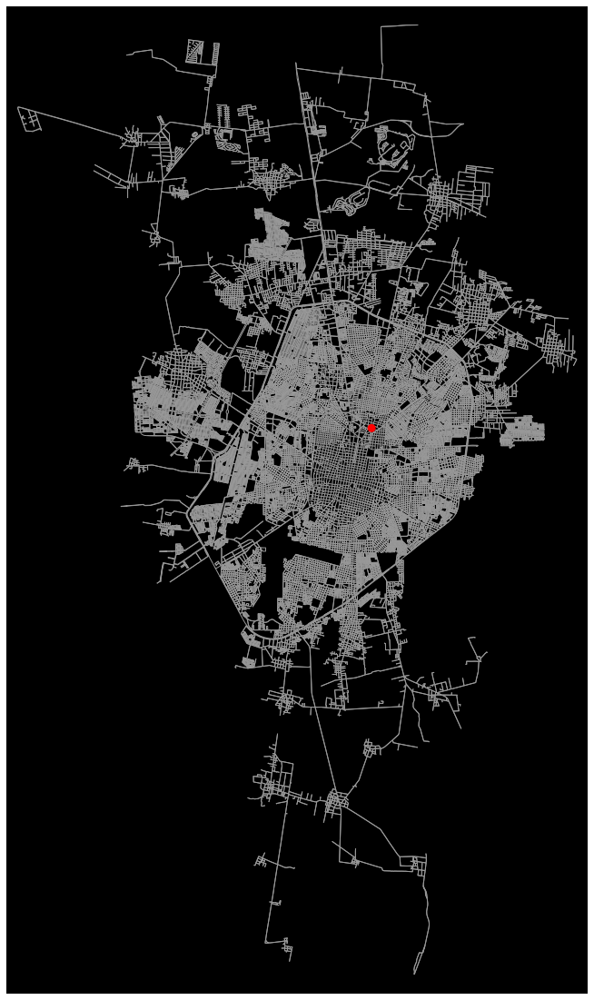

In [39]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/pagerank_maxNode_wholeNetwork.png', dpi=500, axes=False)
plt.show()

A closer look:

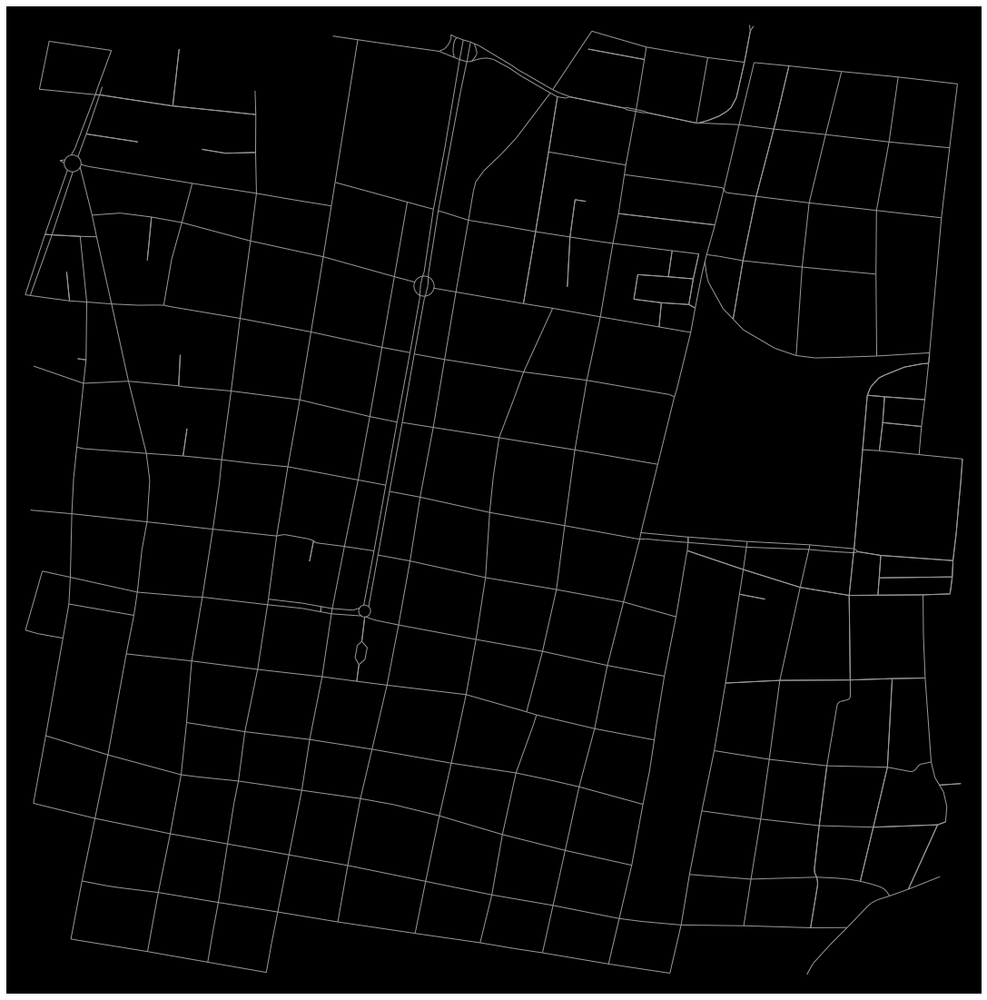

In [40]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9774, -89.6169)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==max_node else 'w' for node in G.nodes()]
ns = [80 if node==max_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/pagerank_maxNode_ZoomCity.png', dpi=300, axes=False)
plt.show()

A more closer look:

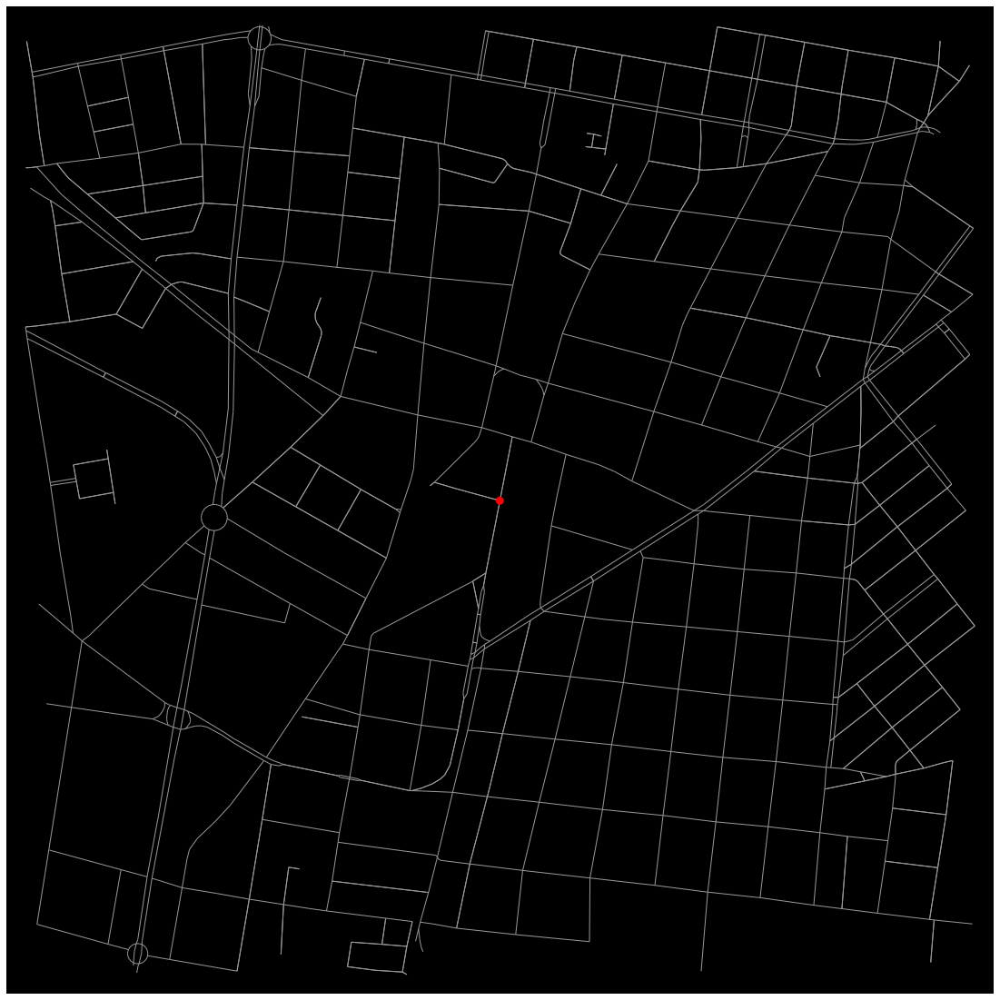

In [41]:
# create a network around some (lat, lng) point and plot it
location_point = (20.99005, -89.61106)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==max_node else 'w' for node in G.nodes()]
ns = [80 if node==max_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/pagerank_maxNode_ZoomSection.png', dpi=300, axes=False)
plt.show()

This node is located at Rotary Internacional Av. and 21A street, colonia Itzimna. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.99005%2C-89.61106#map=17/20.99063/-89.61051

### Min PageRank

In [42]:
min_node, min_pr = stats_merida['pagerank_min_node'], stats_merida['pagerank_min']
min_node, min_pr

(8238297225, 4.514067359141125e-06)

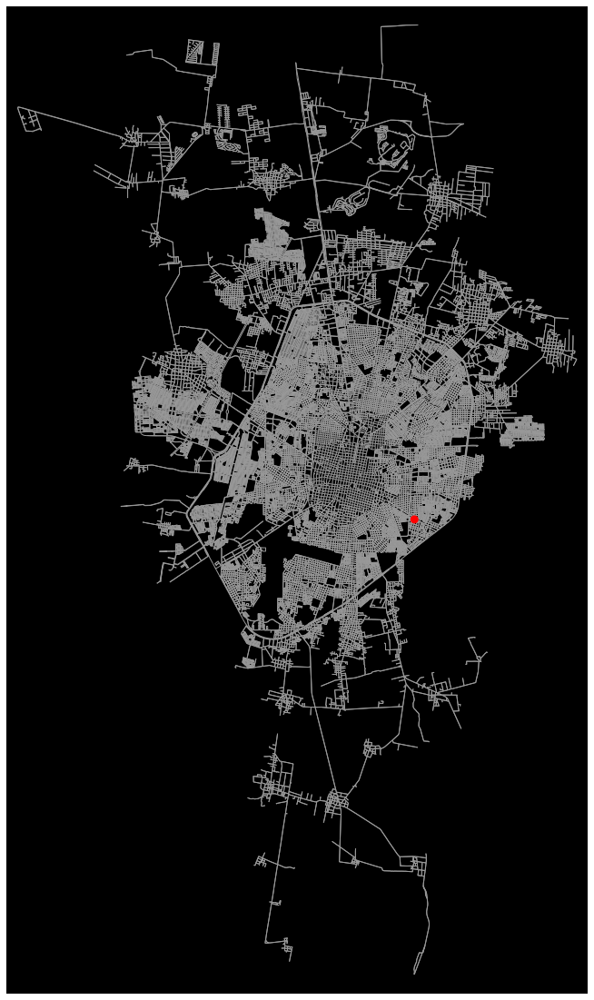

In [43]:
nc = ['r' if node==min_node else 'w' for node in Gs.nodes()]
ns = [80 if node==min_node else 0 for node in Gs.nodes()]

fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/pagerank_minNode_wholeNetwork.png', dpi=500, axes=False)
plt.show()

A closer look:

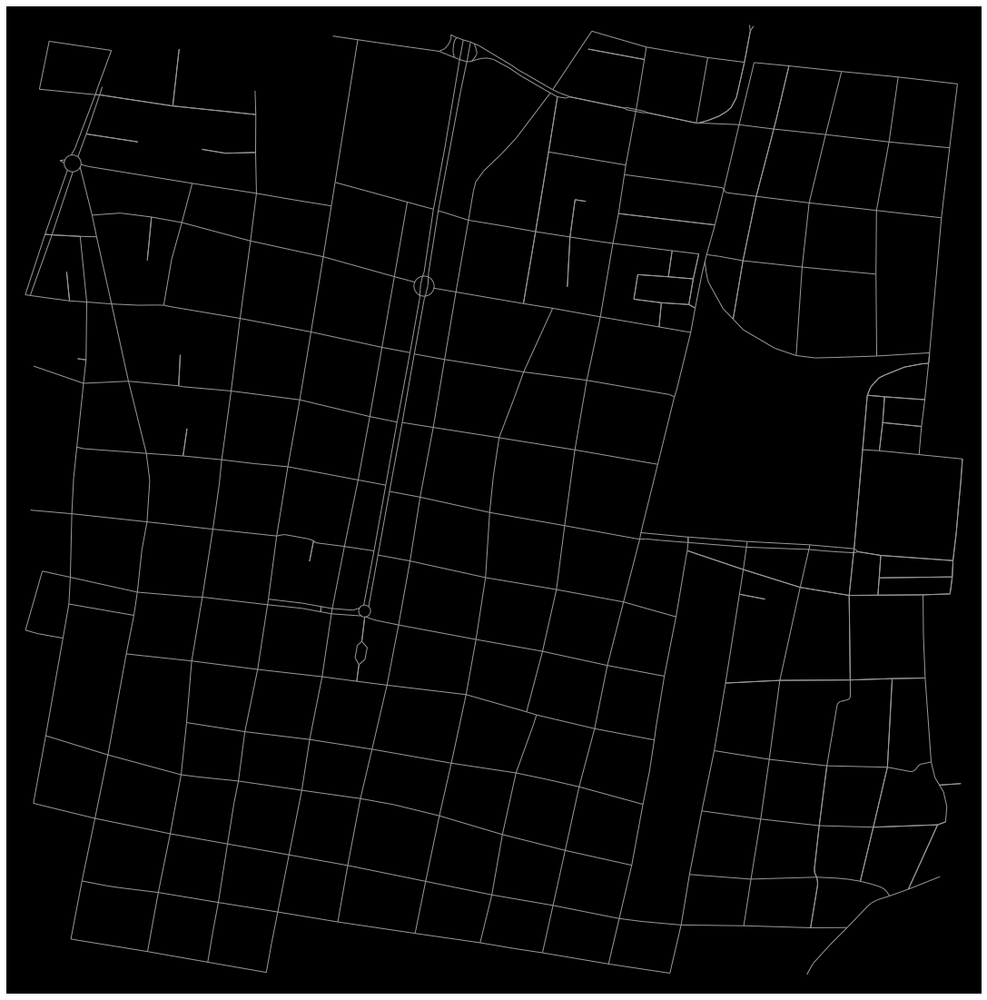

In [44]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9774, -89.6169)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==min_node else 'w' for node in G.nodes()]
ns = [80 if node==min_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/pagerank_minNode_ZoomCity.png', dpi=300, axes=False)
plt.show()

A more closer look:

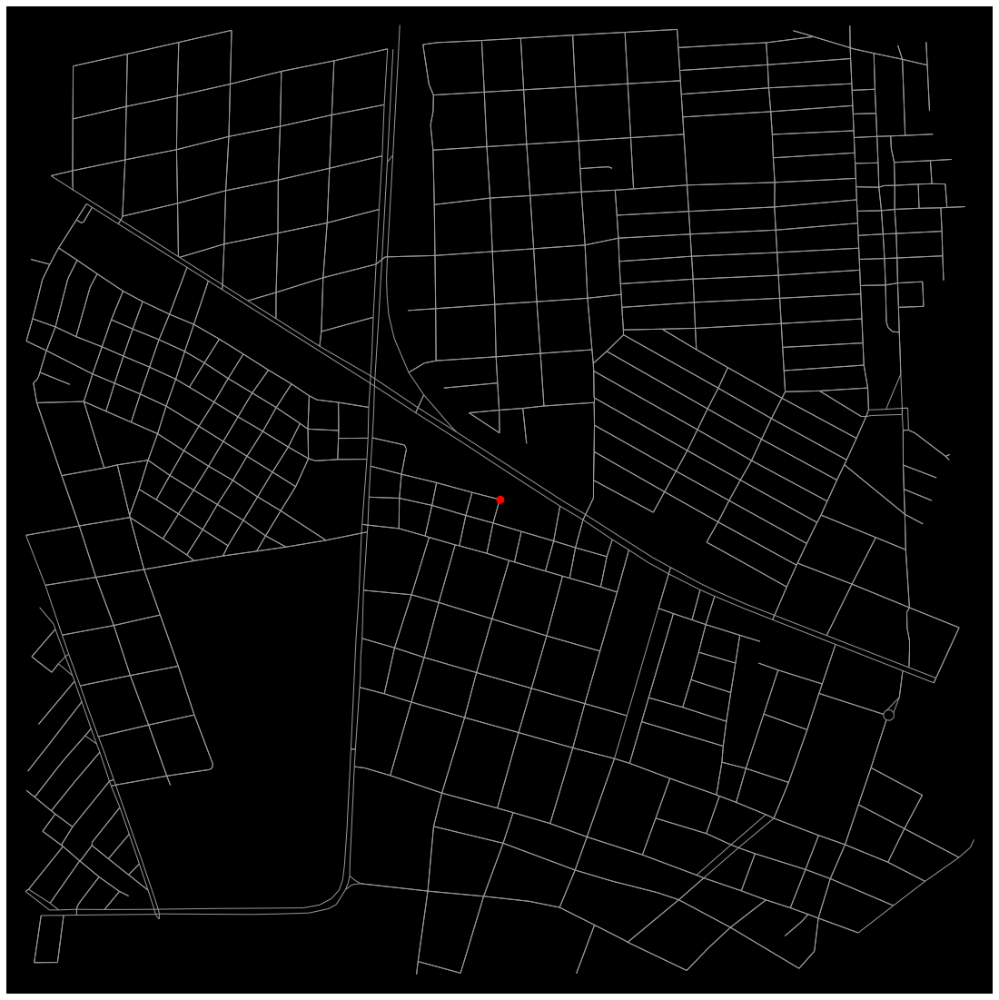

In [45]:
# create a network around some (lat, lng) point and plot it
location_point = (20.94775, -89.58983)
G = get_graph_from_point(location_point, proj=True)

nc = ['r' if node==min_node else 'w' for node in G.nodes()]
ns = [80 if node==min_node else 0 for node in G.nodes()]

fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/pagerank_minNode_ZoomSection.png', dpi=300, axes=False)
plt.show()

This node is located at 71 street and 14 Diagonal street, colonia Miraflores 2. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.94775%2C-89.58983#map=19/20.94775/-89.58983

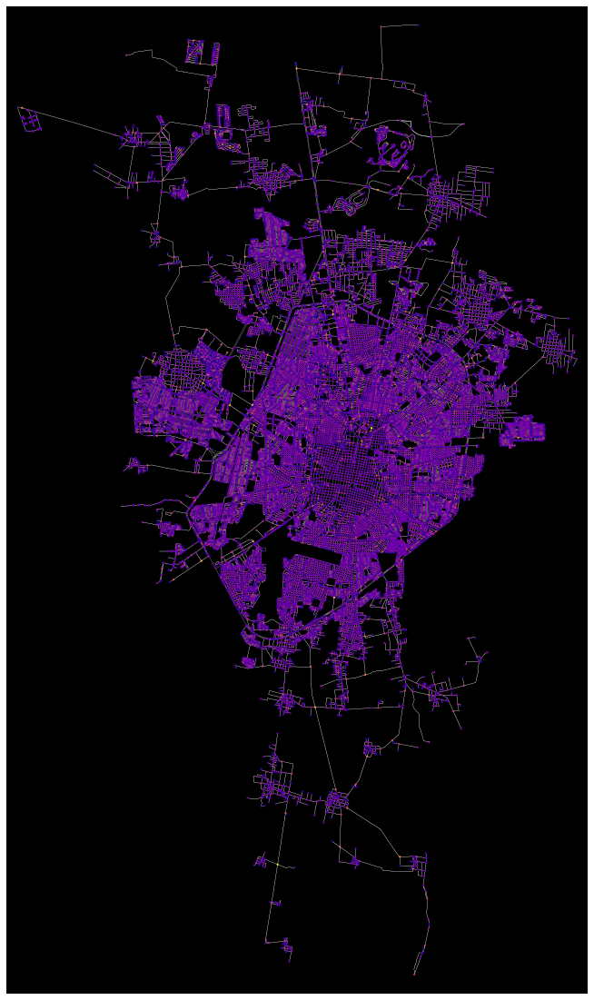

In [46]:
pagerank = ast.literal_eval(stats_merida['pagerank'])

nx.set_node_attributes(Gs, pagerank, 'pagerank')
nc = ox.plot.get_node_colors_by_attr(Gs, 'pagerank', cmap='plasma')

fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', 
                        figsize=(20, 20), 
                        show=False)

save_plot(fig, ax, filepath='./images/pagerank_allNodes.png', dpi=500, axes=False)
plt.show()

# Merida Urban AGEB road network

In [47]:
# read shapefiles with stats and census data of AGEB
data_ageb = gpd.read_file('./data/merida_ageb_stats_census_shp/merida_ageb_stats_census.shp')

# read csv with stats of AGEB
stats_ageb = pd.read_csv('./data/stats_merida_ageb.csv', encoding='utf-8')
# unpack k-counts and k-proportion dicts into individiual keys:values
stats_ageb = stats_ageb.apply(unpack, axis=1)

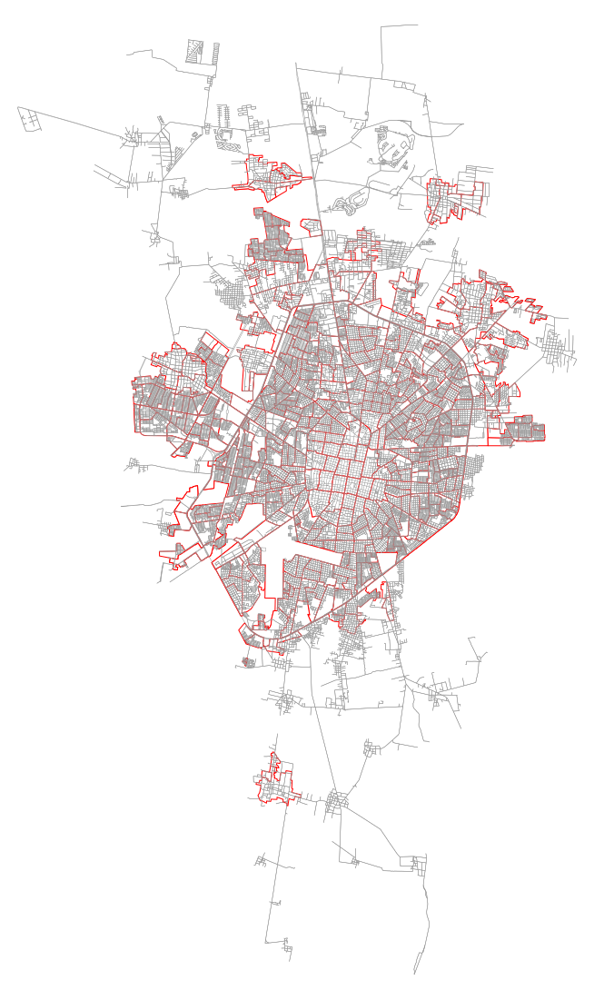

In [48]:
# plot the urban AGEBs with the road network
fig, ax = plt.subplots(figsize=(20, 20), facecolor='white')

data_ageb.geometry.plot(ax=ax, 
                        color='white', 
                        edgecolor='red', 
                        linewidth=1
                       )
ox.plot_graph(Gs, node_size=0, node_color='white', node_zorder=2, bgcolor='k', edge_linewidth=0.5,
                        show=False,
                        ax=ax
                       )

save_plot(fig, ax, filepath='./images/merida-ageb-road-network.png', dpi=500, axes=False)
plt.show()

## Summary

In [49]:
summary = stats_ageb.drop(columns=['CVEGEO', 'CVE_ENT', 'NOM_ENT', 'CVE_LOC', 'NOM_LOC', 'CVE_MUN', 'NOM_MUN', 'AGEB',
                                  'streets_per_node_counts', 
                                   'streets_per_node_proportion',
                                   'avg_neighbor_degree',
                                   'avg_weighted_neighbor_degree',
                                   'degree_centrality',
                                   'clustering_coefficient',
                                   'clustering_coefficient_weighted',
                                   'pagerank',
                                   'betweenness_centrality',
                                   'closeness_centrality',
                                   'nodes'])
summary = summary.describe().T.drop(['count', '25%', '75%'], axis=1).applymap(lambda x: round(x, 3))
summary['dispersion_idx'] = (summary['std']**2) / summary['mean']
#summary.to_csv('./data/summary_agebs.csv', encoding='utf-8')
summary

,mean,std,min,50%,max,dispersion_idx
area,5.824624e+05,5.274442e+05,1.421736e+04,4.746937e+05,7.612708e+06,4.776229e+05
area_km,5.820000e-01,5.270000e-01,1.400000e-02,4.750000e-01,7.613000e+00,4.771976e-01
avg_neighbor_degree_avg,2.477000e+00,4.700000e-01,5.000000e-01,2.556000e+00,3.414000e+00,8.918046e-02
avg_weighted_neighbor_degree_avg,3.900000e-02,1.200000e-02,5.000000e-03,3.900000e-02,9.700000e-02,3.692308e-03
betweenness_centrality_avg,9.500000e-02,5.000000e-02,0.000000e+00,8.800000e-02,3.330000e-01,2.631579e-02
circuity_avg,9.600000e-01,6.600000e-02,9.320000e-01,9.400000e-01,1.741000e+00,4.537500e-03
clean_intersection_count,4.455900e+01,2.260300e+01,1.000000e+00,4.300000e+01,1.420000e+02,1.146560e+01
clean_intersection_density_km,9.337500e+01,4.214900e+01,6.352000e+00,9.127000e+01,2.404000e+02,1.902584e+01
closeness_centrality_avg,2.000000e-03,2.000000e-03,0.000000e+00,2.000000e-03,2.200000e-02,2.000000e-03
clustering_coefficient_avg,2.700000e-02,4.400000e-02,0.000000e+00,1.700000e-02,5.830000e-01,7.170370e-02


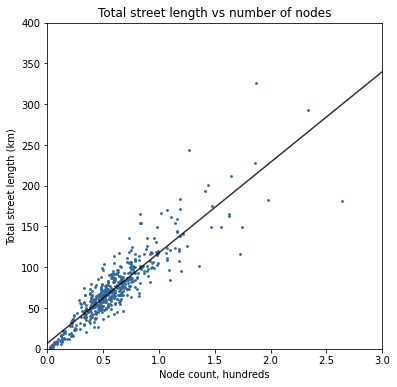

r-squared: 0.81


const      6.753365
n        110.983036
dtype: float64

In [50]:
fig, ax = plt.subplots(figsize=(6, 6), facecolor="white")
x = stats_ageb['n'] / 100
y = stats_ageb['street_length_total'] / 100

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max()/100)*100] #round to nearest greater 10

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.8, linewidth=1.5, zorder=1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Total street length vs number of nodes')
ax.set_xlabel('Node count, hundreds')
ax.set_ylabel('Total street length (km)')

save_plot(fig, ax, './images/merida-ageb-street-length-vs-nodes', axes=True)
plt.show()

print('r-squared:', round(results.rsquared, 2))
results.params

## Streets per node average

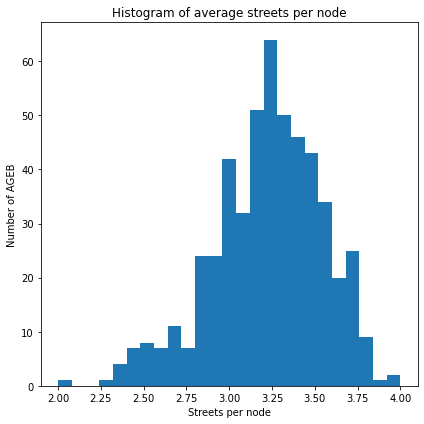

In [51]:
fig, ax = plt.subplots(figsize=(6, 6), facecolor='white')

x = stats_ageb['streets_per_node_avg']
num_bins = 25

# the histogram of the data
n, bins, patches = ax.hist(x, bins=num_bins)

ax.set_xlabel('Streets per node')
ax.set_ylabel('Number of AGEB')
ax.set_title(r'Histogram of average streets per node')
# Tweak spacing to prevent clipping of ylabel
fig.tight_layout()
save_plot(fig, ax, filepath='./images/merida-ageb-histogram-avg-streets-per-node.png', axes=True)
plt.show()

In [52]:
# only look at large AGEBs
min_area = 474693.7 # the 50% of the describe
variable = 'streets_per_node_avg'
stats_ageb[stats_ageb['area'] > min_area][['CVEGEO', variable]].sort_values(by=variable)

,CVEGEO,streets_per_node_avg
487,3105000845545,2.396226
64,3105000016628,2.431818
452,3105000016793,2.450867
26,3105000012216,2.477941
30,3105000016261,2.506329
...,...,...
218,3105000010737,3.714286
165,3105000011523,3.750000
442,3105000010455,3.777778
35,3105000010629,3.794118


## Intersection density per $km^2$

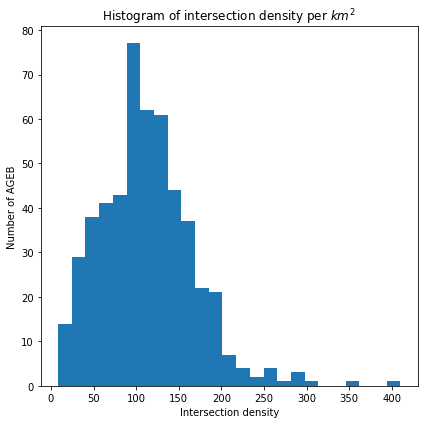

In [53]:
fig, ax = plt.subplots(figsize=(6, 6), facecolor='white')

x = stats_ageb['intersection_density_km']
num_bins = 25

# the histogram of the data
n, bins, patches = ax.hist(x, bins=num_bins)

ax.set_xlabel('Intersection density')
ax.set_ylabel('Number of AGEB')
ax.set_title(r'Histogram of intersection density per $km^2$')
# Tweak spacing to prevent clipping of ylabel
fig.tight_layout()
save_plot(fig, ax, filepath='./images/merida-ageb-histogram-intersection-density.png', axes=True)
plt.show()

In [54]:
variable = 'intersection_density_km'
stats_ageb[['CVEGEO', variable]].sort_values(by=variable, ascending=False)

,CVEGEO,intersection_density_km
74,3105000017039,410.011278
316,3105000014142,351.016299
268,3105000013197,302.365674
60,3105000014532,295.429613
283,3105000012324,287.159460
...,...,...
273,310500001078A,12.216414
139,3105000014778,10.587291
9,3105001116276,9.351580
500,3105000776331,9.225642


## Street length average

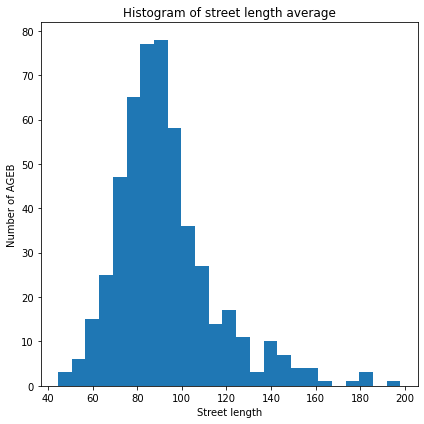

In [55]:
fig, ax = plt.subplots(figsize=(6, 6), facecolor='white')

x = stats_ageb['street_length_avg']
num_bins = 25

# the histogram of the data
n, bins, patches = ax.hist(x, bins=num_bins)

ax.set_xlabel('Street length')
ax.set_ylabel('Number of AGEB')
ax.set_title(r'Histogram of street length average')
# Tweak spacing to prevent clipping of ylabel
fig.tight_layout()
save_plot(fig, ax, filepath='./images/merida-ageb-histogram-street-length-avg.png', axes=True)
plt.show()

In [56]:
# sort by street length average
variable = 'street_length_avg'
stats_ageb[['CVEGEO', variable]].sort_values(by=variable, ascending=False)

,CVEGEO,street_length_avg
500,3105000776331,198.010000
372,3105000015386,182.792073
325,3105000016172,181.827000
290,3105000014937,179.833667
139,3105000014778,176.333400
...,...,...
131,3105000014157,52.983447
122,3105000014335,50.873000
316,3105000014142,48.829148
74,3105000017039,47.785458


## Intersection density vs 3-way intersection proportion

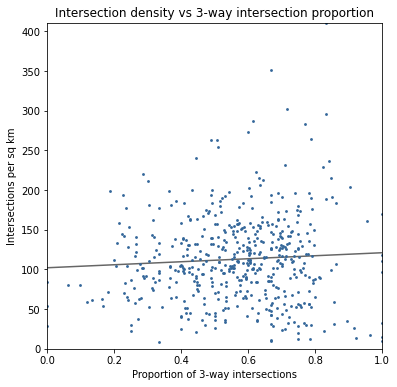

r-squared: 0.0038282047532318675


const                 102.132963
int_3_streets_prop     18.926232
dtype: float64

In [57]:
fig, ax = plt.subplots(figsize=(6, 6), facecolor="white")

y = stats_ageb['intersection_density_km']
x = stats_ageb['int_3_streets_prop']

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs 3-way intersection proportion')
ax.set_ylabel('Intersections per sq km')
ax.set_xlabel('Proportion of 3-way intersections')

save_plot(fig, ax, filepath='./images/merida-ageb-intersection-density-vs-k3.png', axes=True)
plt.show()

print('r-squared:', results.rsquared)
results.params

## Circuity vs 3-way intersection proportion

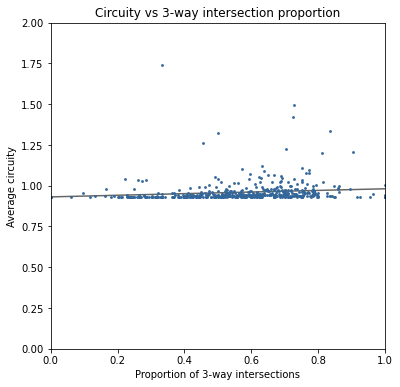

r-squared: 0.018532094236183516


const                 0.931498
int_3_streets_prop    0.049761
dtype: float64

In [58]:
fig, ax = plt.subplots(figsize=(6, 6), facecolor="white")

y = stats_ageb['circuity_avg']
x = stats_ageb['int_3_streets_prop']

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Circuity vs 3-way intersection proportion')
ax.set_ylabel('Average circuity')
ax.set_xlabel('Proportion of 3-way intersections')

save_plot(fig, ax, filepath='./images/merida-ageb-circuity-vs-k3.png', axes=True)
plt.show()

print('r-squared:', results.rsquared)
results.params

In [59]:
# node and edge density per km are hard to interpret when using municipal boundaries
# as municipal boundaries vary greatly in their extents around the built-up area
by_loc = stats_ageb.groupby(['NOM_MUN', 'CVE_LOC'])[['intersection_density_km', 
                     'streets_per_node_avg', 
                     'circuity_avg',
                     'street_length_avg']].median().sort_values(by='intersection_density_km').applymap(lambda x: round(x, 2))
#by_town.sort_index().to_csv('by_state.csv', encoding='utf-8')
by_loc.sort_index()

intersection_density_km  streets_per_node_avg  circuity_avg  \
NOM_MUN CVE_LOC                                                                
Mérida  1                         112.24                  3.27          0.94   
        75                         37.02                  3.17          0.94   
        77                         30.71                  3.00          0.93   
        84                         55.00                  2.84          0.98   
        93                         34.68                  2.95          1.00   
        111                        28.21                  2.62          0.94   

                 street_length_avg  
NOM_MUN CVE_LOC                     
Mérida  1                    87.65  
        75                  142.02  
        77                  144.79  
        84                  109.71  
        93                  131.11  
        111                 134.50

## Map AGEBs by attribute

### Betweenness centrality

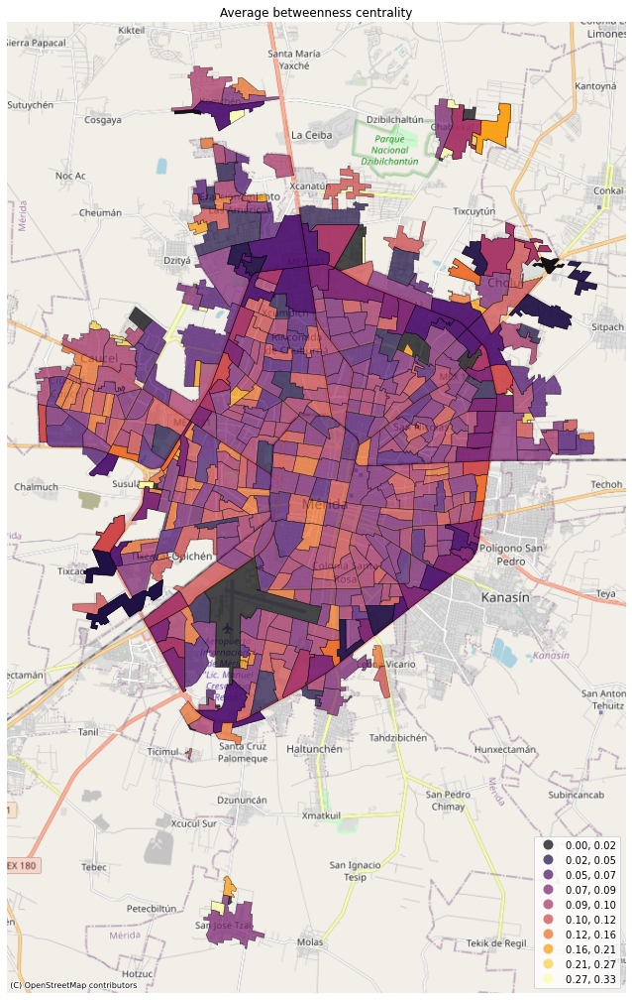

In [60]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'btwn_c_avg'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average betweenness centrality')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-betweenness.png', dpi=300, axes=False)
plt.show()

### Closeness centrality

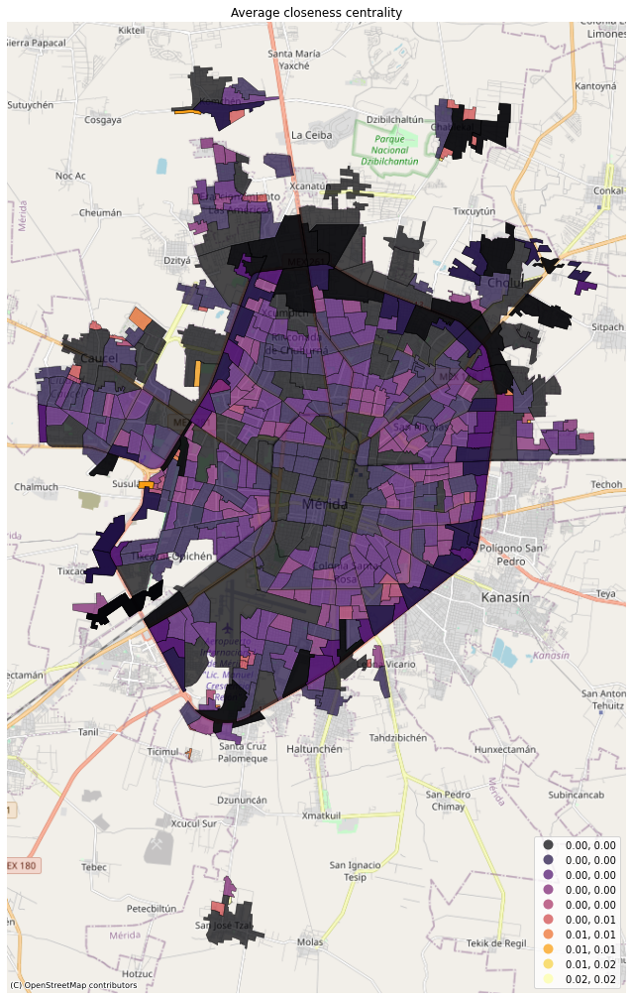

In [61]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'clos_c_avg'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average closeness centrality')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-closeness.png', dpi=300, axes=False)
plt.show()

### Degree centrality

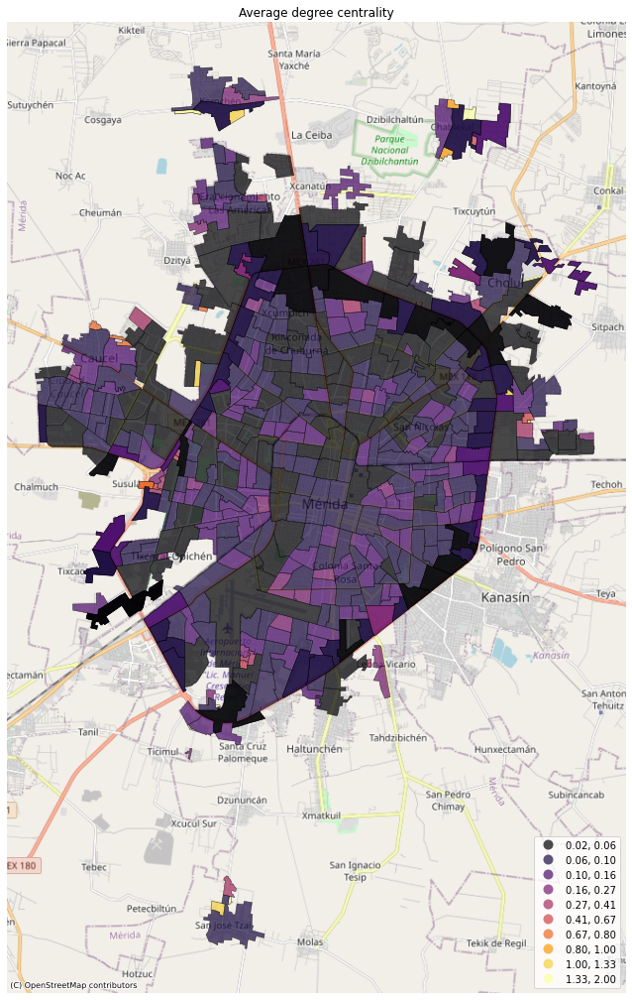

In [62]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'degcen_avg'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average degree centrality')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-degree-centrality.png', dpi=300, axes=False)
plt.show()

### Intersection density per km$^2$

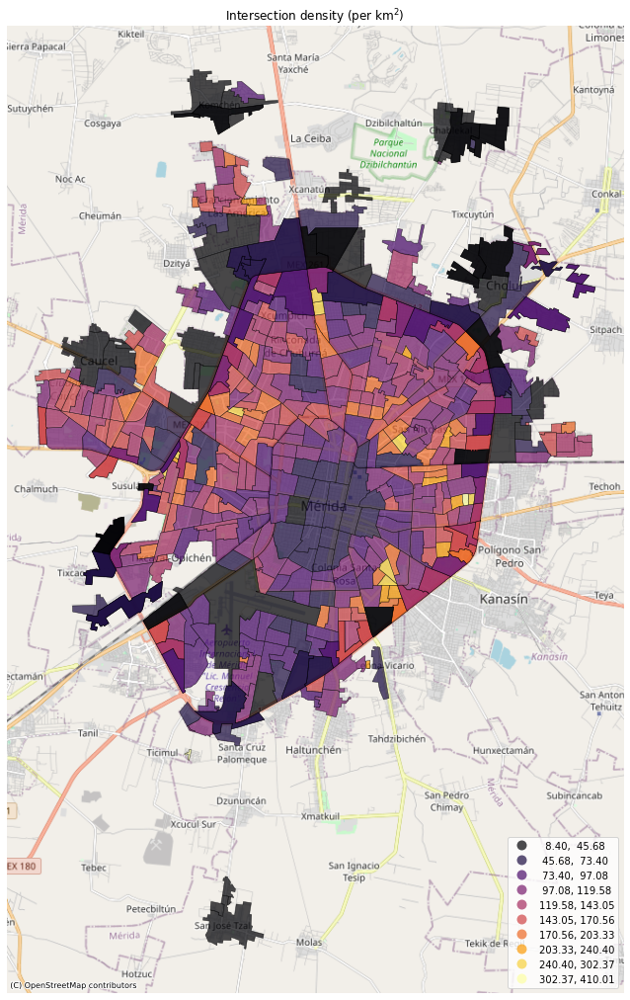

In [63]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'int_dty_km'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Intersection density (per km$^2$)')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-intersection-density.png', dpi=300, axes=False)
plt.show()

### Streets per node average

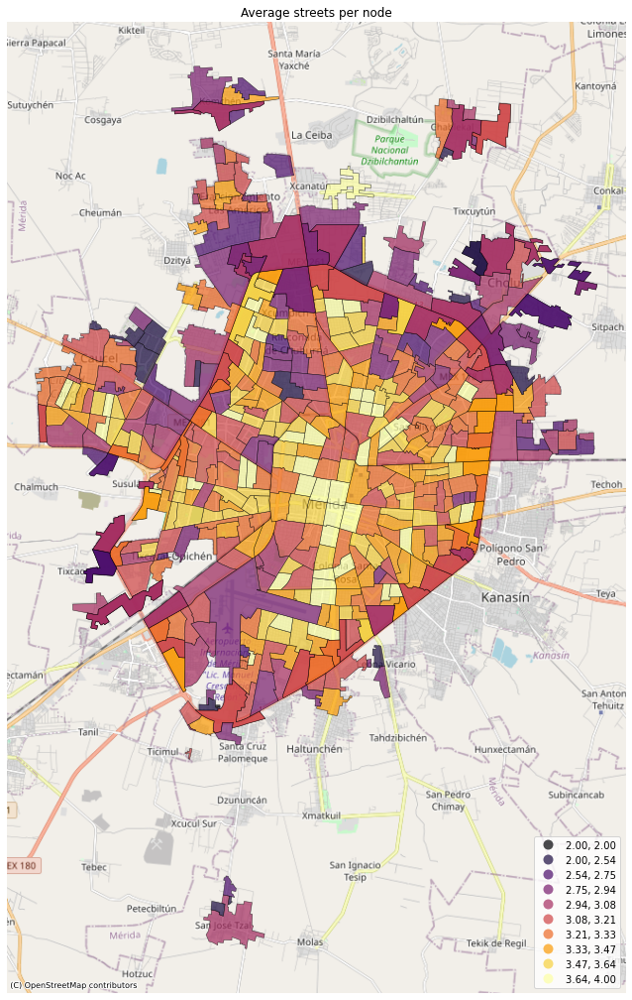

In [64]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'st_n_avg'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average streets per node')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-avg-streets-per-node.png', dpi=300, axes=False)
plt.show()

### Average street length

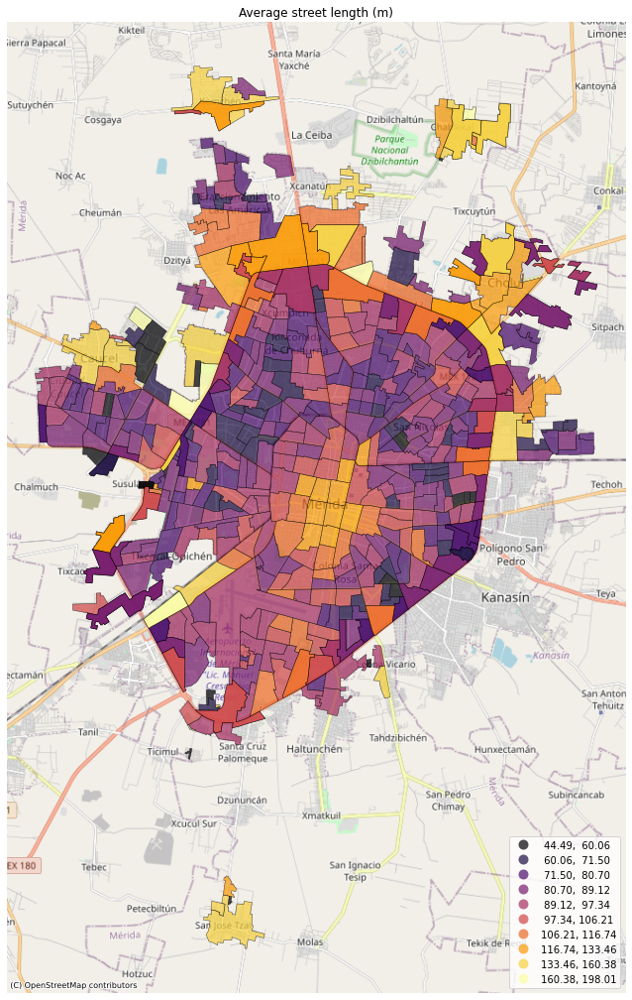

In [65]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'st_len_avg'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average street length (m)')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-avg-street-length.png', dpi=300, axes=False)
plt.show()

### Clustering coefficient

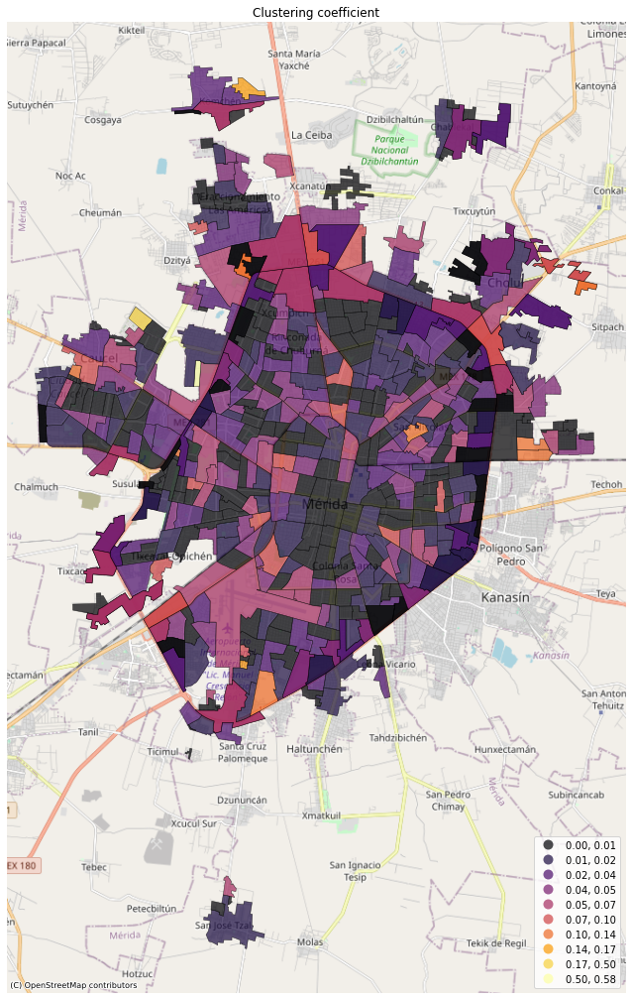

In [66]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'c_cof_avg'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Clustering coefficient')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-clustering-coefficient.png', dpi=300, axes=False)
plt.show()

### Census data

#### Population density

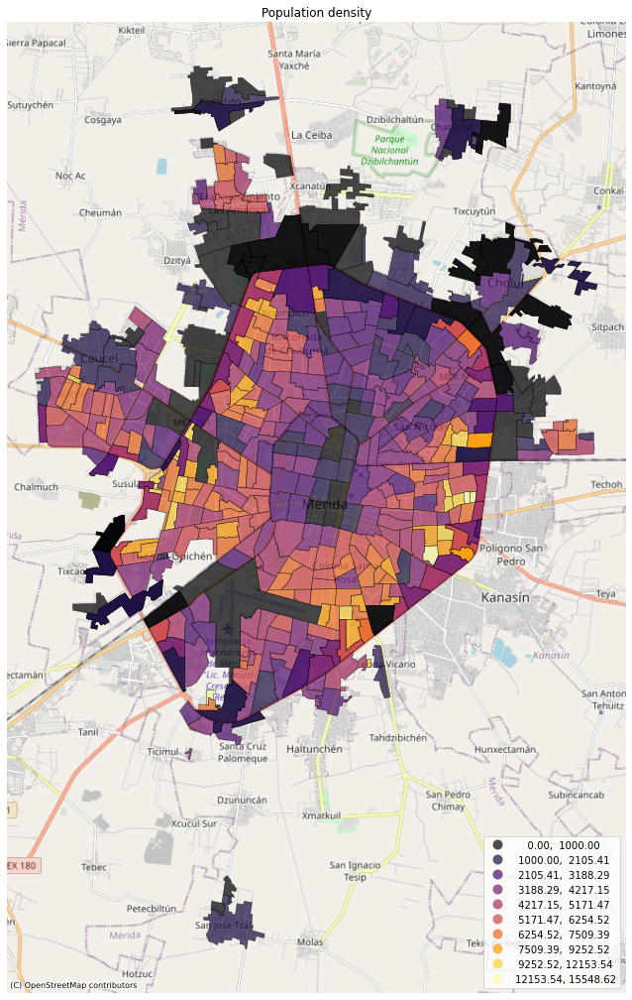

In [67]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'popdensity'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Population density')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-population-density.png', dpi=300, axes=False)
plt.show()

##### Intersection density

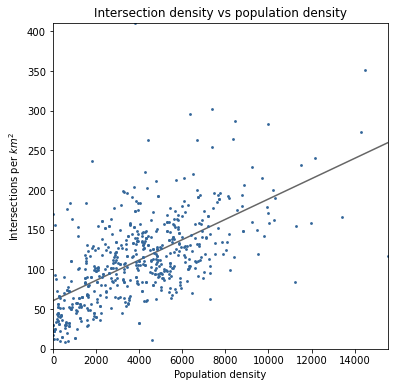

In [68]:
fig, ax = plt.subplots(figsize=(6, 6))

y = data_ageb['int_dty_km']
x = data_ageb['popdensity']

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs population density')
ax.set_ylabel('Intersections per $km^2$')
ax.set_xlabel('Population density')

save_plot(fig, ax, filepath='./images/merida-ageb-intersection-density-vs-population-density.png', axes=True)
plt.show()

##### Streets per node average

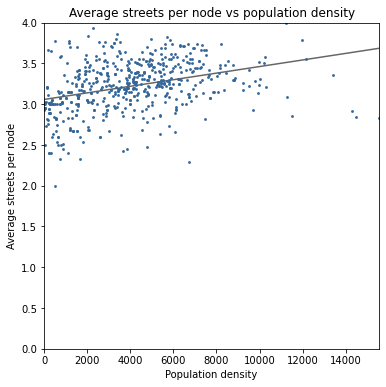

In [69]:
fig, ax = plt.subplots(figsize=(6, 6))

y = data_ageb['st_n_avg']
x = data_ageb['popdensity']

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average streets per node vs population density')
ax.set_ylabel('Average streets per node')
ax.set_xlabel('Population density')

save_plot(fig, ax, filepath='./images/merida-ageb-avg-streets-per-node-vs-population-density.png', axes=True)
plt.show()

##### Average street length

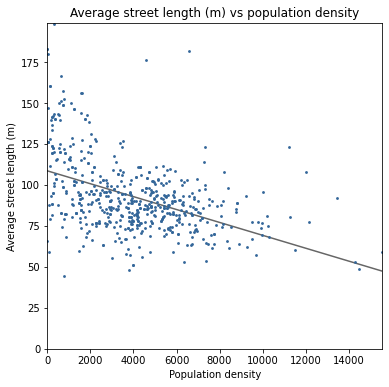

In [70]:
fig, ax = plt.subplots(figsize=(6, 6))

y = data_ageb['st_len_avg']
x = data_ageb['popdensity']

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average street length (m) vs population density')
ax.set_ylabel('Average street length (m)')
ax.set_xlabel('Population density')

save_plot(fig, ax, filepath='./images/merida-ageb-avg-street-length-vs-population-density.png', axes=True)
plt.show()

#### Population economically active

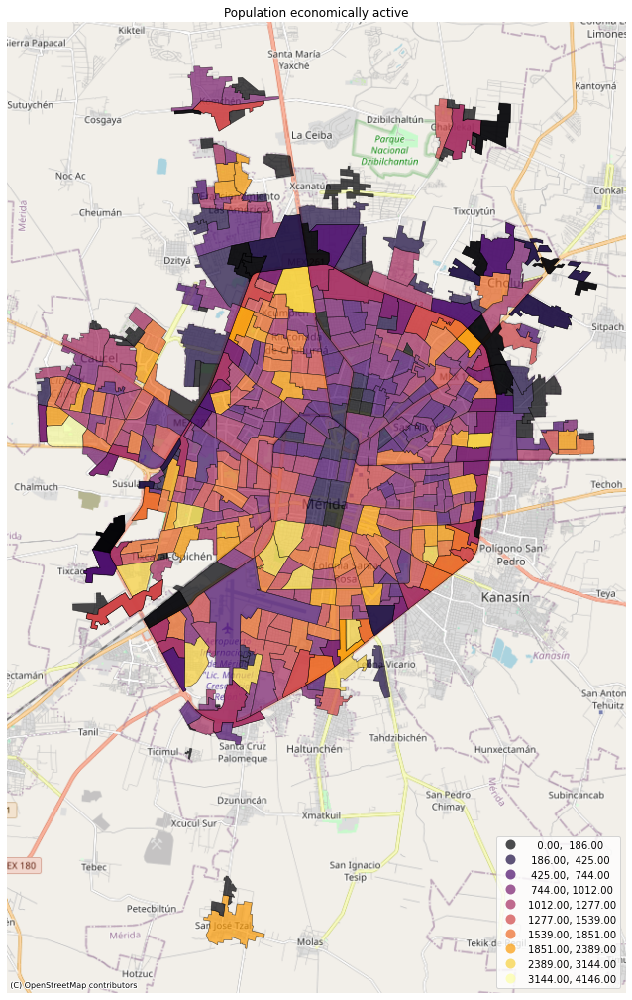

In [71]:
fig, ax = plt.subplots(figsize=(18, 18))

variable = 'PEA'
data_ageb.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data_ageb.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Population economically active')
ax.axis('off')

save_plot(fig, ax, filepath='./images/merida-ageb-population-economically-active.png', dpi=300, axes=False)
plt.show()

##### Intersection density

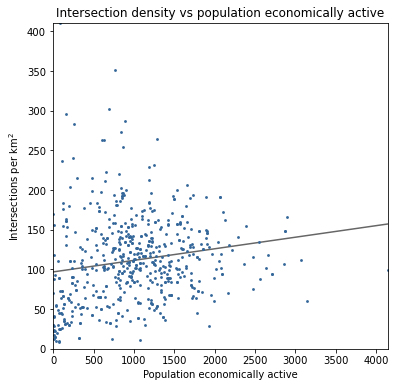

In [72]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data_ageb['int_dty_km']
x = data_ageb['PEA']

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs population economically active')
ax.set_ylabel('Intersections per km$^2$')
ax.set_xlabel('Population economically active')

save_plot(fig, ax, filepath='./images/merida-ageb-intersection-density-vs-population-economically-active.png', axes=True)
plt.show()

##### Streets per node average

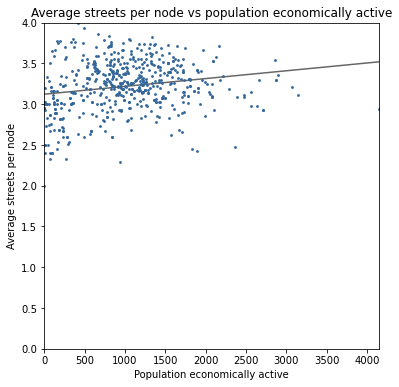

In [73]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data_ageb['st_n_avg']
x = data_ageb['PEA']

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average streets per node vs population economically active')
ax.set_ylabel('Average streets per node')
ax.set_xlabel('Population economically active')

save_plot(fig, ax, filepath='./images/merida-ageb-avg-streets-per-node-vs-population-economically-active.png', axes=True)
plt.show()

##### Average street length

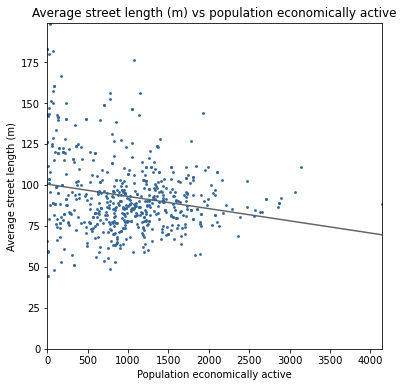

In [74]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data_ageb['st_len_avg']
x = data_ageb['PEA']

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average street length (m) vs population economically active')
ax.set_ylabel('Average street length (m)')
ax.set_xlabel('Population economically active')

save_plot(fig, ax, filepath='./images/merida-ageb-avg-street-length-vs-population-economically-active.png', axes=True)
plt.show()